# Assignment 01

In [3]:
import pandas as pd
import os
import numpy as np
from datetime import datetime, timedelta

## Check for Missing Values

In [4]:
def check_missing_values(df: pd.DataFrame, df_name: str = "DataFrame"):

    if df.empty:
        print(f"\nWarning: {df_name} is empty. Cannot perform missing value check.")
        return

    
    separator_length = 60
    print("\n" + "="*separator_length)
   
    print(f"## Detailed Missing Value Check in {df_name}")
    print("="*separator_length)

   
    missing_values = df.isnull().sum()
    
    missing_values = missing_values[missing_values > 0]

    if missing_values.empty:
        print(f"No missing (NaN) values found in the {df_name}.")
    else:
        print(f"Missing values found for the following variables in {df_name}:")
        print("\nColumn Name | NaN Count")
        print("--------------------|----------")
        
        for column, count in missing_values.sort_values(ascending=False).items():
            print(f"{column.ljust(18)}| {count}")

    print("="*separator_length)

## Check for Duplicates

### Identifies all duplicate rows based on the specified key columns

In [5]:
def check_for_duplicates(df: pd.DataFrame, df_name: str, key: list):
  
    separator_length = 60
    print("\n" + "="*separator_length)
    print(f"## Duplicate Entry Check for: {df_name}")
    print(f"Key used: {key}")
    print("="*separator_length)

    if df.empty:
        print(f"Warning: {df_name} is empty. Skipping duplicate check.")
        return

    duplicate_rows = df[df.duplicated(subset=key, keep=False)]

    if duplicate_rows.empty:
        print(f"No duplicate entries found for the key {tuple(key)} in {df_name}.")
    else:
        num_duplicates = len(duplicate_rows)
       
        num_groups = num_duplicates - duplicate_rows.drop_duplicates(subset=key).shape[0]
        
        print(f"{num_duplicates} duplicate rows identified based on the key {tuple(key)}.")
        print(f"(These rows belong to {num_groups} unique sets of duplicate key values.)")
        
        print("\nSample of Duplicate Rows (showing all entries for the duplicated key):")
      
        print(duplicate_rows.sort_values(by=key).head())
        
    print("="*separator_length)

## Dataset: Food Demand Forecasting

| Criterion | Details |
|------------|----------|
| **Name of the Dataset** | Food Demand Forecasting Dataset |
| **Source (Link)** | [Kaggle: Food Demand Forecasting](https://www.kaggle.com/competitions/food-demand-forecasting) |
| **Description of Data Measures** | The data measures the weekly number of orders (demand) for specific center-meal combinations within a multi-city meal delivery company. The goal is to predict future demand to optimize the planning of perishable raw material stock and staffing at various fulfillment centers. |
| **Frequency of the Data** | Weekly. The raw material replenishment and forecasting task are structured around weekly intervals. |
| **Time Span Covered** | The available historical data (training set) covers an unspecified period, ending at Week 145. The competition task requires forecasting demand for the subsequent 10 weeks (Weeks 146–155). |


### Load dataset + merge

In [6]:
data_dir = '/kaggle/input/food-demand-forecasting' 

try:
    train_df = pd.read_csv(os.path.join(data_dir, 'train.csv'))
    test_df = pd.read_csv(os.path.join(data_dir, 'test.csv'))
    center_info_df = pd.read_csv(os.path.join(data_dir, 'fulfilment_center_info.csv'))
    meal_info_df = pd.read_csv(os.path.join(data_dir, 'meal_info.csv'))

    print("Dataframes loaded successfully!")
    print(f"Training data shape: {train_df.shape}")
    
   
    train_df = pd.merge(train_df, center_info_df, on='center_id', how='left')
    train_df = pd.merge(train_df, meal_info_df, on='meal_id', how='left')
    
    test_df = pd.merge(test_df, center_info_df, on='center_id', how='left')
    test_df = pd.merge(test_df, meal_info_df, on='meal_id', how='left')

    print("\nSample of Merged Training Data:")
    print(train_df.head())

except FileNotFoundError:
    print(f"\nError: Could not find files in the '{data_dir}' directory.")
    print("Please ensure the Kaggle API download command in Step 1 ran correctly.")

print (train_df.columns)

Dataframes loaded successfully!
Training data shape: (456548, 9)

Sample of Merged Training Data:
        id  week  center_id  meal_id  checkout_price  base_price  \
0  1379560     1         55     1885          136.83      152.29   
1  1466964     1         55     1993          136.83      135.83   
2  1346989     1         55     2539          134.86      135.86   
3  1338232     1         55     2139          339.50      437.53   
4  1448490     1         55     2631          243.50      242.50   

   emailer_for_promotion  homepage_featured  num_orders  city_code  \
0                      0                  0         177        647   
1                      0                  0         270        647   
2                      0                  0         189        647   
3                      0                  0          54        647   
4                      0                  0          40        647   

   region_code center_type  op_area   category cuisine  
0           56 

### Check for Missing Values

In [7]:
check_missing_values(train_df, df_name="Training Data")
check_missing_values(test_df, df_name="Test Data")


## Detailed Missing Value Check in Training Data
No missing (NaN) values found in the Training Data.

## Detailed Missing Value Check in Test Data
No missing (NaN) values found in the Test Data.


### Validate the Timestamp Sequence:

In [8]:
print("\n## Timestamp Validation - Center Level")
center_week_counts = train_df.groupby('center_id')['week'].nunique()
expected_weeks = train_df['week'].nunique()
centers_missing_weeks = center_week_counts[center_week_counts < expected_weeks]

print(f"Total unique centers: {len(center_week_counts)}")
print(f"Expected weeks per center: {expected_weeks}")
print(f"Centers with all weeks present: {len(center_week_counts) - len(centers_missing_weeks)}")
print(f"Centers missing some weeks: {len(centers_missing_weeks)}")

if len(centers_missing_weeks) > 0:
    print("\nCenters with incomplete week coverage:")
    for center_id, week_count in centers_missing_weeks.head(10).items():
        missing_count = expected_weeks - week_count
        print(f"Center {center_id}: {week_count}/{expected_weeks} weeks (missing {missing_count})")

print("\n## Timestamp Validation - Meal Level")
meal_week_counts = train_df.groupby('meal_id')['week'].nunique()
meals_missing_weeks = meal_week_counts[meal_week_counts < expected_weeks]

print(f"Total unique meals: {len(meal_week_counts)}")
print(f"Expected weeks per meal: {expected_weeks}")
print(f"Meals with all weeks present: {len(meal_week_counts) - len(meals_missing_weeks)}")
print(f"Meals missing some weeks: {len(meals_missing_weeks)}")

if len(meals_missing_weeks) > 0:
    print("\nMeals with incomplete week coverage:")
    for meal_id, week_count in meals_missing_weeks.head(10).items():
        missing_count = expected_weeks - week_count
        print(f"Meal {meal_id}: {week_count}/{expected_weeks} weeks (missing {missing_count})")

print("\n## Combined Center-Meal Validation")
center_meal_week_counts = train_df.groupby(['center_id', 'meal_id'])['week'].nunique()
center_meal_missing = center_meal_week_counts[center_meal_week_counts < expected_weeks]

print(f"Total unique center-meal combinations: {len(center_meal_week_counts)}")
print(f"Complete center-meal time series: {len(center_meal_week_counts) - len(center_meal_missing)}")
print(f"Incomplete center-meal time series: {len(center_meal_missing)}")

if len(center_meal_missing) > 0:
    gap_percentage = (len(center_meal_missing) / len(center_meal_week_counts)) * 100
    print(f"Data completeness: {100 - gap_percentage:.1f}%")


## Timestamp Validation - Center Level
Total unique centers: 77
Expected weeks per center: 145
Centers with all weeks present: 76
Centers missing some weeks: 1

Centers with incomplete week coverage:
Center 24: 120/145 weeks (missing 25)

## Timestamp Validation - Meal Level
Total unique meals: 51
Expected weeks per meal: 145
Meals with all weeks present: 45
Meals missing some weeks: 6

Meals with incomplete week coverage:
Meal 1571: 87/145 weeks (missing 58)
Meal 2104: 87/145 weeks (missing 58)
Meal 2490: 125/145 weeks (missing 20)
Meal 2569: 129/145 weeks (missing 16)
Meal 2664: 133/145 weeks (missing 12)
Meal 2956: 87/145 weeks (missing 58)

## Combined Center-Meal Validation
Total unique center-meal combinations: 3597
Complete center-meal time series: 1247
Incomplete center-meal time series: 2350
Data completeness: 34.7%


### Check for Duplicates

In [9]:
time_series_key = ['week', 'center_id', 'meal_id']


check_for_duplicates(train_df, "Merged Training Data", time_series_key)
check_for_duplicates(test_df, "Merged Test Data", time_series_key)


## Duplicate Entry Check for: Merged Training Data
Key used: ['week', 'center_id', 'meal_id']
No duplicate entries found for the key ('week', 'center_id', 'meal_id') in Merged Training Data.

## Duplicate Entry Check for: Merged Test Data
Key used: ['week', 'center_id', 'meal_id']
No duplicate entries found for the key ('week', 'center_id', 'meal_id') in Merged Test Data.


### Remain only needed columns

In [10]:
train_df.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'city_code',
       'region_code', 'center_type', 'op_area', 'category', 'cuisine'],
      dtype='object')

In [11]:
train_df = train_df[['id', 'week', 'center_id', 'meal_id',  'checkout_price','num_orders', 'category', 'cuisine']]
train_df

,id,week,center_id,meal_id,checkout_price,num_orders,category,cuisine
0,1379560,1,55,1885,136.83,177,Beverages,Thai
1,1466964,1,55,1993,136.83,270,Beverages,Thai
2,1346989,1,55,2539,134.86,189,Beverages,Thai
3,1338232,1,55,2139,339.50,54,Beverages,Indian
4,1448490,1,55,2631,243.50,40,Beverages,Indian
...,...,...,...,...,...,...,...,...
456543,1271326,145,61,1543,484.09,68,Desert,Indian
456544,1062036,145,61,2304,482.09,42,Desert,Indian
456545,1110849,145,61,2664,237.68,501,Salad,Italian
456546,1147725,145,61,2569,243.50,729,Salad,Italian


/tmp/ipykernel_39/2929640091.py:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


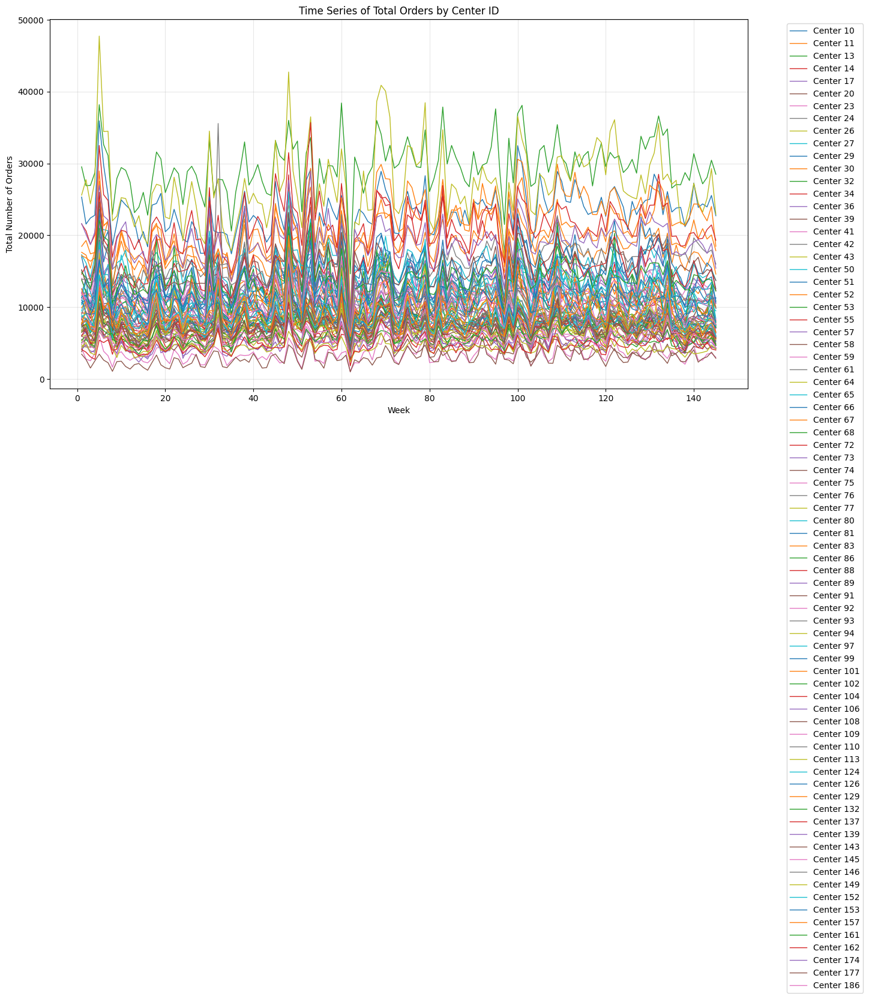

In [12]:
import matplotlib.pyplot as plt

center_weekly_orders = train_df.groupby(['week', 'center_id'])['num_orders'].sum().unstack()

plt.figure(figsize=(15, 8))
for center_id in center_weekly_orders.columns:
    plt.plot(center_weekly_orders.index, center_weekly_orders[center_id], label=f'Center {center_id}', linewidth=1)

plt.title('Time Series of Total Orders by Center ID')
plt.xlabel('Week')
plt.ylabel('Total Number of Orders')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

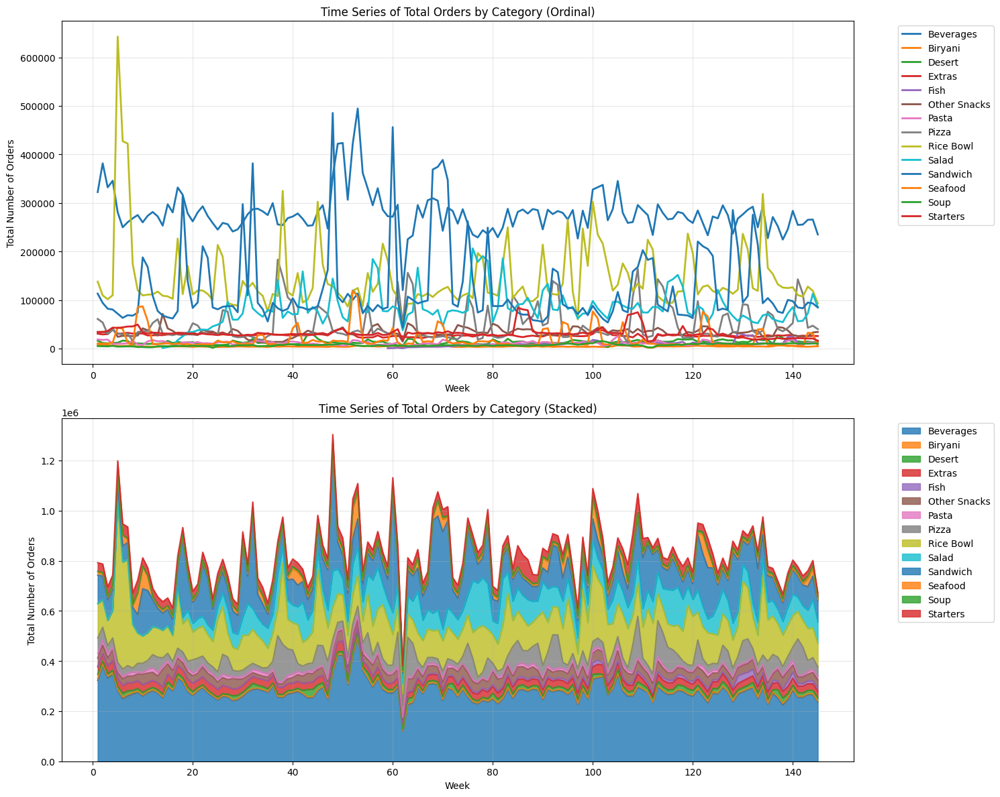

In [13]:
import matplotlib.pyplot as plt

category_weekly_orders = train_df.groupby(['week', 'category'])['num_orders'].sum().unstack()

plt.figure(figsize=(15, 12))

plt.subplot(2, 1, 1)
for category in category_weekly_orders.columns:
    plt.plot(category_weekly_orders.index, category_weekly_orders[category], label=category, linewidth=2)
plt.title('Time Series of Total Orders by Category (Ordinal)')
plt.xlabel('Week')
plt.ylabel('Total Number of Orders')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)

plt.subplot(2, 1, 2)
category_weekly_orders.plot(kind='area', stacked=True, alpha=0.8, ax=plt.gca())
plt.title('Time Series of Total Orders by Category (Stacked)')
plt.xlabel('Week')
plt.ylabel('Total Number of Orders')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

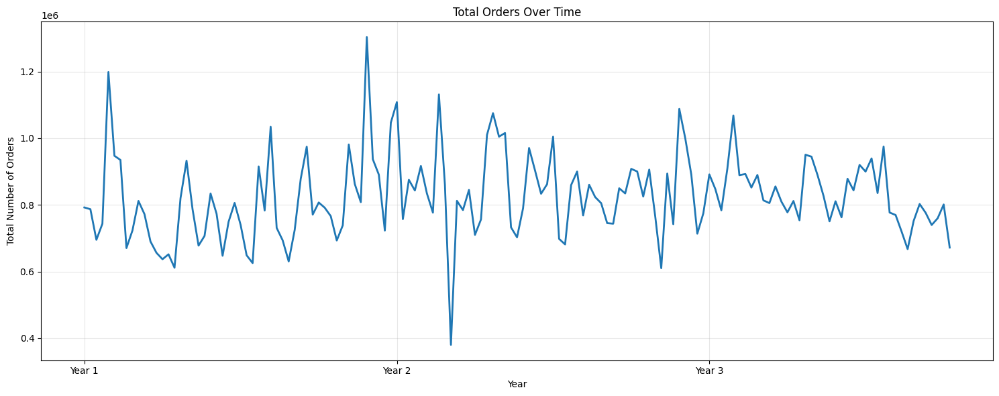

In [14]:
import matplotlib.pyplot as plt

weekly_orders = train_df.groupby('week')['num_orders'].sum()

years = ((weekly_orders.index - 1) // 52) + 1
year_labels = [f'Year {int(year)}' for year in years]

plt.figure(figsize=(15, 6))
plt.plot(weekly_orders.index, weekly_orders.values, linewidth=2)
plt.title('Total Orders Over Time')
plt.xlabel('Year')
plt.ylabel('Total Number of Orders')
plt.xticks(ticks=range(1, len(weekly_orders) + 1, 52), labels=year_labels[::52])
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


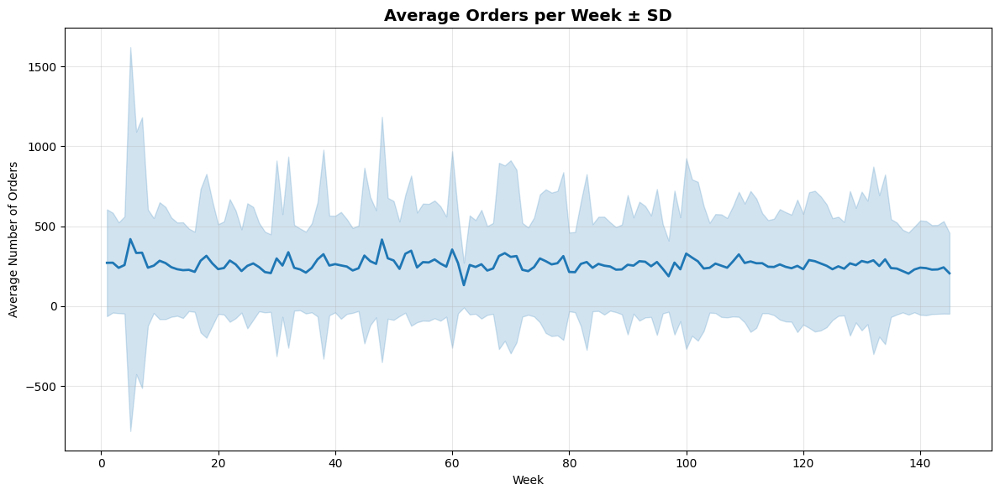

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.lineplot(data=train_df, x='week', y='num_orders', 
             errorbar='sd', linewidth=2)
plt.title('Average Orders per Week ± SD', fontsize=14, fontweight='bold')
plt.xlabel('Week')
plt.ylabel('Average Number of Orders')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

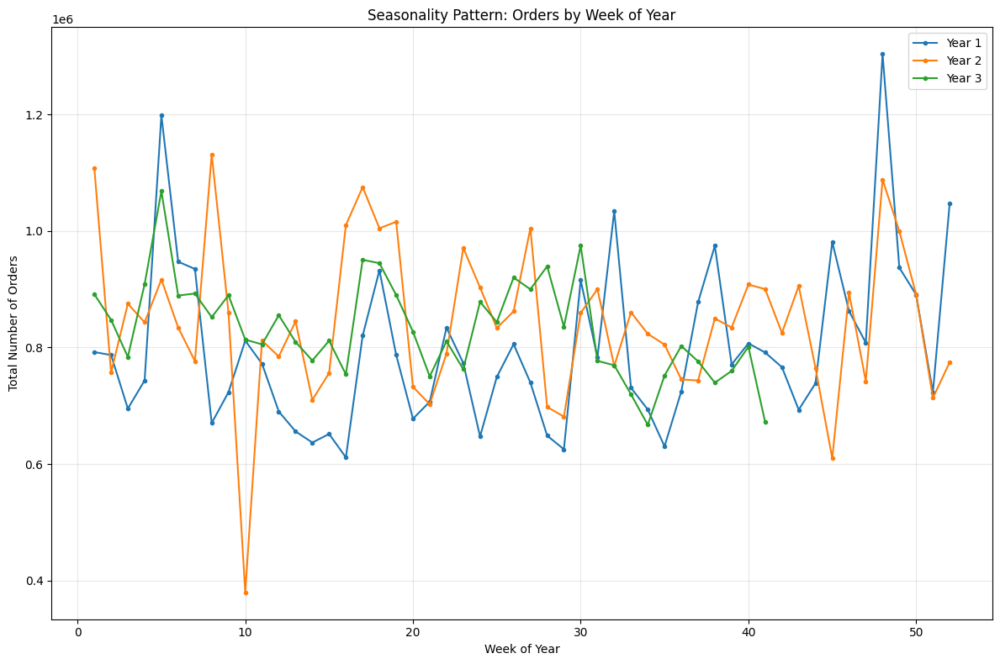

In [16]:
weekly_orders = train_df.groupby('week')['num_orders'].sum()

week_in_year = [(week - 1) % 52 + 1 for week in weekly_orders.index]
year = [(week - 1) // 52 + 1 for week in weekly_orders.index]

plt.figure(figsize=(12, 8))
for yr in set(year):
    mask = [y == yr for y in year]
    weeks = [week_in_year[i] for i in range(len(week_in_year)) if mask[i]]
    orders = [weekly_orders.iloc[i] for i in range(len(weekly_orders)) if mask[i]]
    plt.plot(weeks, orders, label=f'Year {yr}', marker='o', markersize=3)

plt.title('Seasonality Pattern: Orders by Week of Year')
plt.xlabel('Week of Year')
plt.ylabel('Total Number of Orders')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

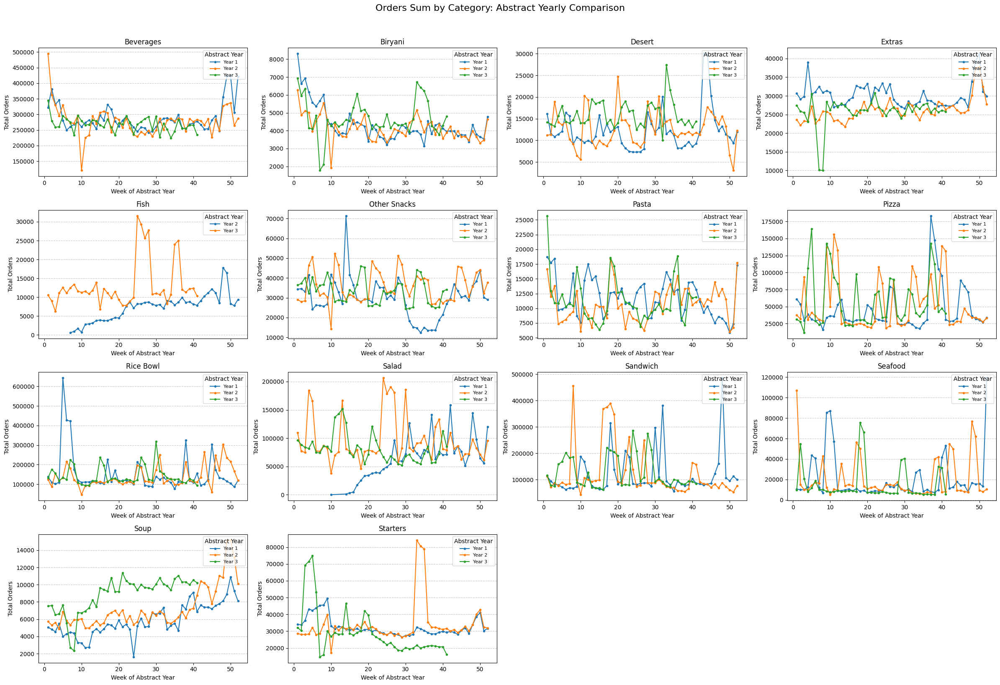

In [23]:
train_df['abstract_year'] = (train_df['week'] - 1) // 52 + 1
train_df['week_of_year'] = (train_df['week'] - 1) % 52 + 1

yearly_orders = train_df.groupby(['category', 'abstract_year', 'week_of_year'])['num_orders'].sum().reset_index()

categories = yearly_orders['category'].unique()
n_categories = len(categories)

cols = int(np.ceil(np.sqrt(n_categories)))
rows = int(np.ceil(n_categories / cols))

fig, axes = plt.subplots(rows, cols, figsize=(cols * 6, rows * 4), squeeze=False)
axes = axes.flatten()

for i, category in enumerate(categories):
    ax = axes[i]
    category_data = yearly_orders[yearly_orders['category'] == category]

    for year in sorted(category_data['abstract_year'].unique()):
        plot_data = category_data[category_data['abstract_year'] == year]
        ax.plot(plot_data['week_of_year'], plot_data['num_orders'], label=f'Year {year}', marker='.')

    ax.set_title(f'{category}', fontsize=12)
    ax.set_xlabel('Week of Abstract Year', fontsize=10)
    ax.set_ylabel('Total Orders', fontsize=10)
    ax.legend(title='Abstract Year', loc='upper right', fontsize=8)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

for j in range(n_categories, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle('Orders Sum by Category: Abstract Yearly Comparison', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

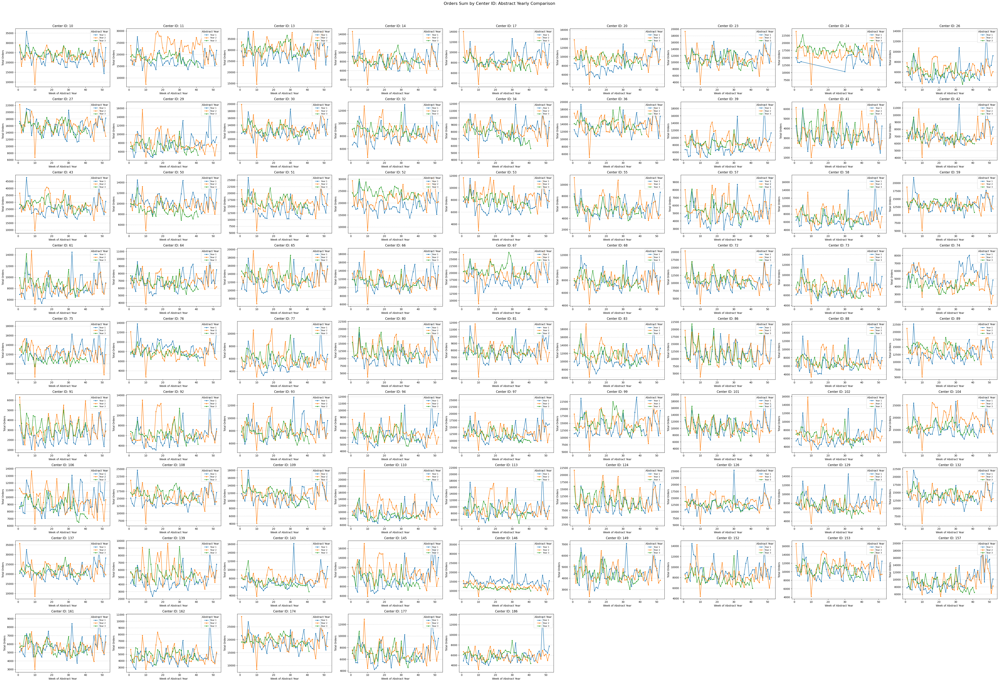

In [25]:
train_df['abstract_year'] = (train_df['week'] - 1) // 52 + 1
train_df['week_of_year'] = (train_df['week'] - 1) % 52 + 1

yearly_orders = train_df.groupby(['center_id', 'abstract_year', 'week_of_year'])['num_orders'].sum().reset_index()

centers = yearly_orders['center_id'].unique()
n_centers = len(centers)

cols = int(np.ceil(np.sqrt(n_centers)))
rows = int(np.ceil(n_centers / cols))

fig, axes = plt.subplots(rows, cols, figsize=(cols * 6, rows * 4), squeeze=False)
axes = axes.flatten()

for i, center in enumerate(centers):
    ax = axes[i]
    center_data = yearly_orders[yearly_orders['center_id'] == center]

    for year in sorted(center_data['abstract_year'].unique()):
        plot_data = center_data[center_data['abstract_year'] == year]
        ax.plot(plot_data['week_of_year'], plot_data['num_orders'], label=f'Year {year}', marker='.')

    ax.set_title(f'Center ID: {center}', fontsize=12)
    ax.set_xlabel('Week of Abstract Year', fontsize=10)
    ax.set_ylabel('Total Orders', fontsize=10)
    ax.legend(title='Abstract Year', loc='upper right', fontsize=8)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

for j in range(n_centers, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle('Orders Sum by Center ID: Abstract Yearly Comparison', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

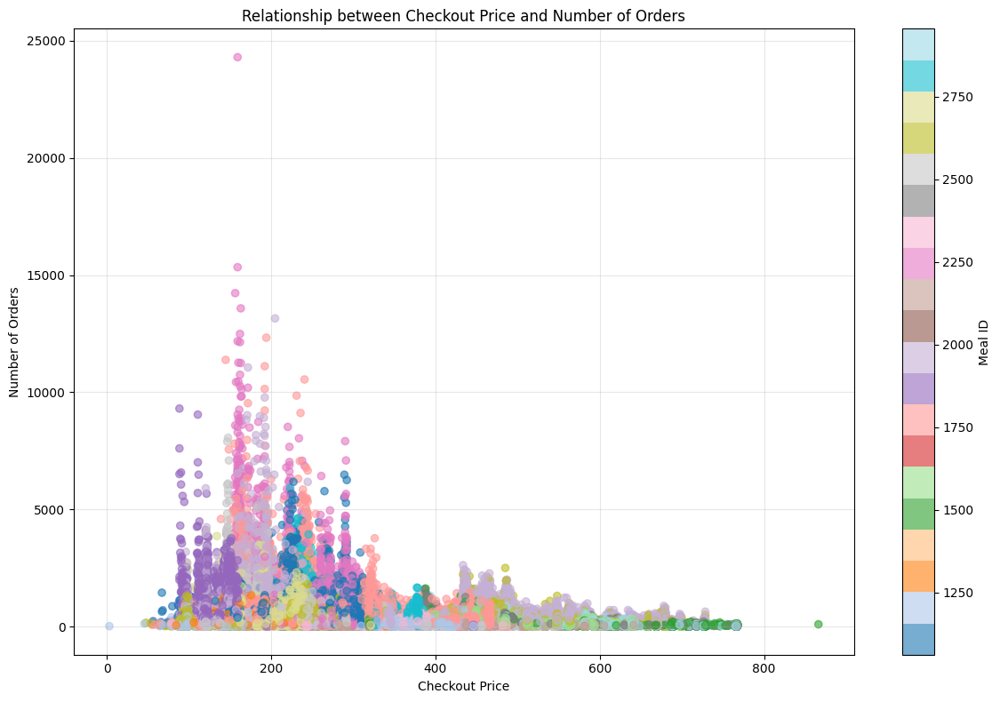

In [30]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
scatter = plt.scatter(train_df['checkout_price'], train_df['num_orders'], 
                     c=train_df['meal_id'], cmap='tab20', alpha=0.6)
plt.colorbar(scatter, label='Meal ID')
plt.title('Relationship between Checkout Price and Number of Orders')
plt.xlabel('Checkout Price')
plt.ylabel('Number of Orders')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


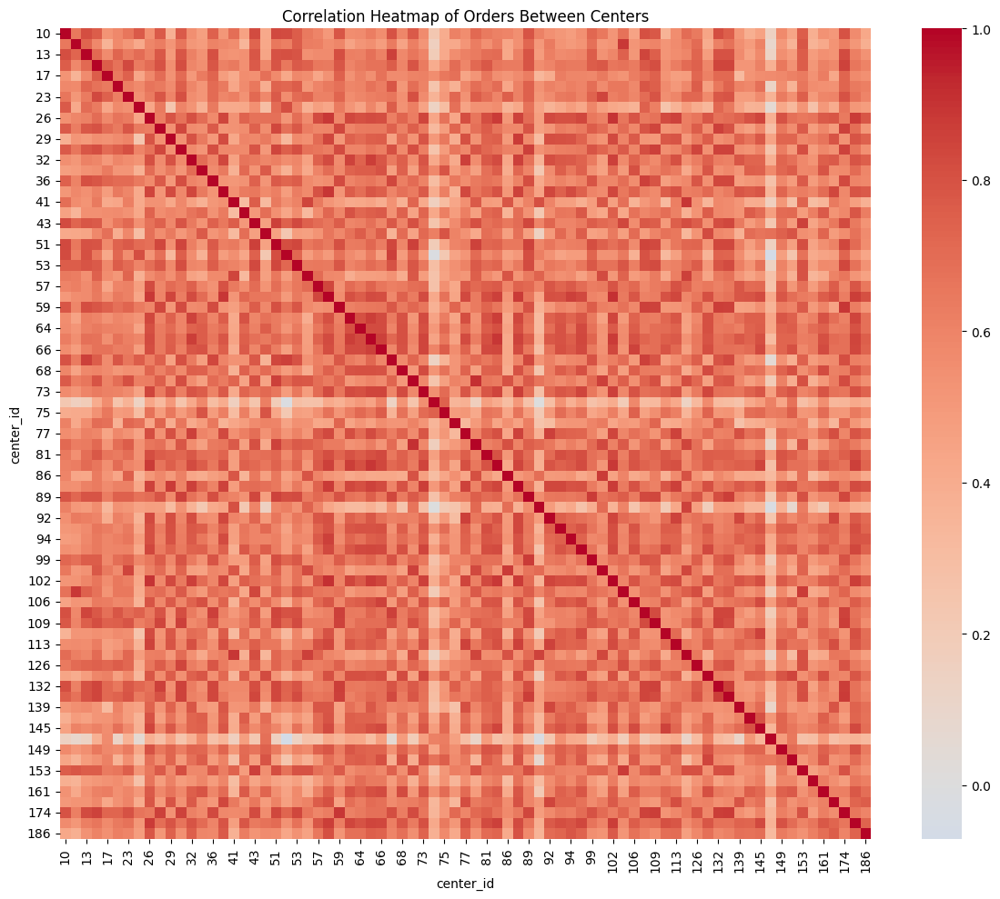

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

pivot_data = train_df.pivot_table(index='week', columns='center_id', values='num_orders', aggfunc='sum')
correlation_matrix = pivot_data.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap of Orders Between Centers')
plt.tight_layout()
plt.show()

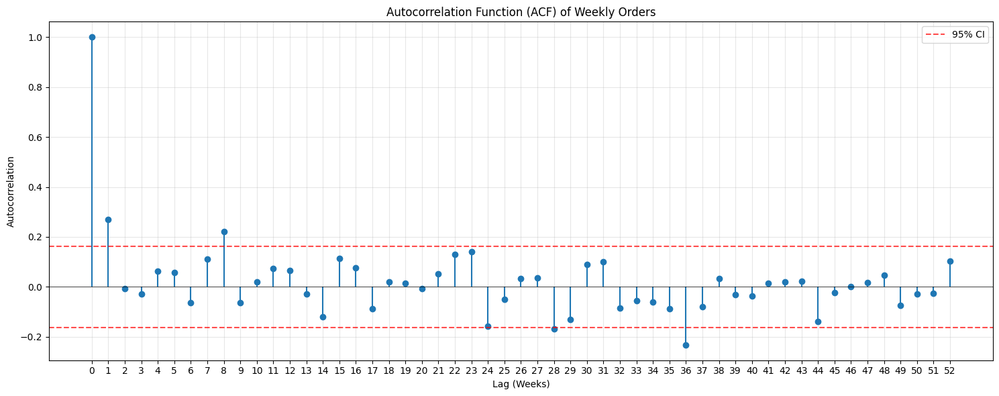

In [38]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

weekly_orders = train_df.groupby('week')['num_orders'].sum()

def compute_acf(series, max_lag):
    n = len(series)
    mean = series.mean()
    acf = []
    for lag in range(max_lag + 1):
        if lag == 0:
            acf.append(1.0)
        else:
            numerator = np.sum((series[lag:] - mean) * (series[:-lag] - mean))
            denominator = np.sum((series - mean) ** 2)
            acf.append(numerator / denominator)
    return acf

max_lag = 52
acf_values = compute_acf(weekly_orders.values, max_lag)
ci = 1.96 / np.sqrt(len(weekly_orders))

plt.figure(figsize=(15, 6))
plt.stem(range(max_lag + 1), acf_values, basefmt=" ")
plt.axhline(y=ci, color='red', linestyle='--', alpha=0.7, label='95% CI')
plt.axhline(y=-ci, color='red', linestyle='--', alpha=0.7)
plt.axhline(y=0, color='black', linewidth=0.5)
plt.title('Autocorrelation Function (ACF) of Weekly Orders')
plt.xlabel('Lag (Weeks)')
plt.ylabel('Autocorrelation')
plt.xticks(range(0, max_lag + 1))
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

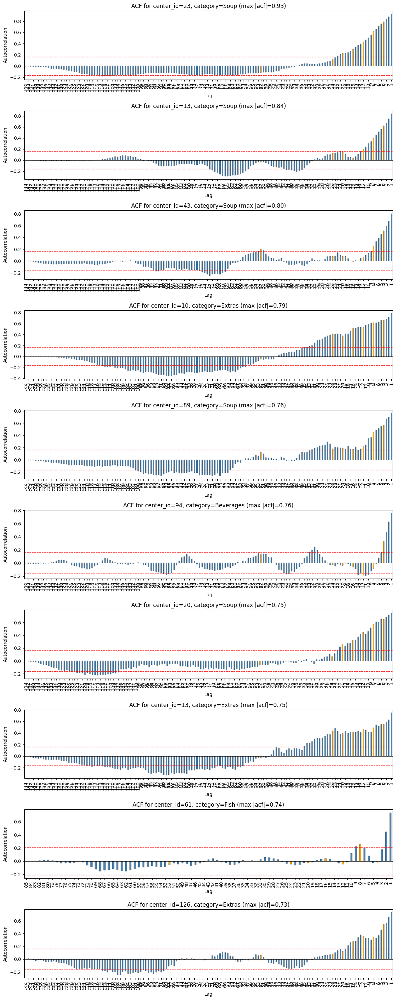

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import acf
import numpy as np

category_orders = (
    train_df
    .groupby(['category', 'week'], as_index=False)['num_orders']
    .sum()
)

categories = category_orders['category'].unique()

plt.figure(figsize=(12, len(categories)*3))

# Define possible seasonal lags (adjust based on your data)
seasonal_lags = [52, 52*2, 52*3]

for i, cat in enumerate(categories, 1):
    ts = category_orders.loc[category_orders['category'] == cat, ['week', 'num_orders']].sort_values('week')
    ts_series = ts['num_orders'].reset_index(drop=True)
    T = len(ts_series)
    max_lag = T - 1
    acf_values = acf(ts_series, nlags=max_lag, fft=True)[1:]
    lags = np.arange(1, max_lag + 1)
    ci = 1.96 / np.sqrt(T)

    plt.subplot(len(categories), 1, i)
    colors = ['orange' if lag in seasonal_lags else 'steelblue' for lag in lags]
    plt.bar(lags, acf_values, width=0.4, color=colors, edgecolor='black', linewidth=0.3)
    plt.axhline(y=ci, color='red', linestyle='--', linewidth=1)
    plt.axhline(y=-ci, color='red', linestyle='--', linewidth=1)
    plt.axhline(y=0, color='black', linewidth=0.8)
    plt.xlim(max_lag + 0.5, 0.5)
    plt.xticks(lags, rotation=90)
    plt.title(f'ACF for category: {cat}')
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')

plt.tight_layout()
plt.show()


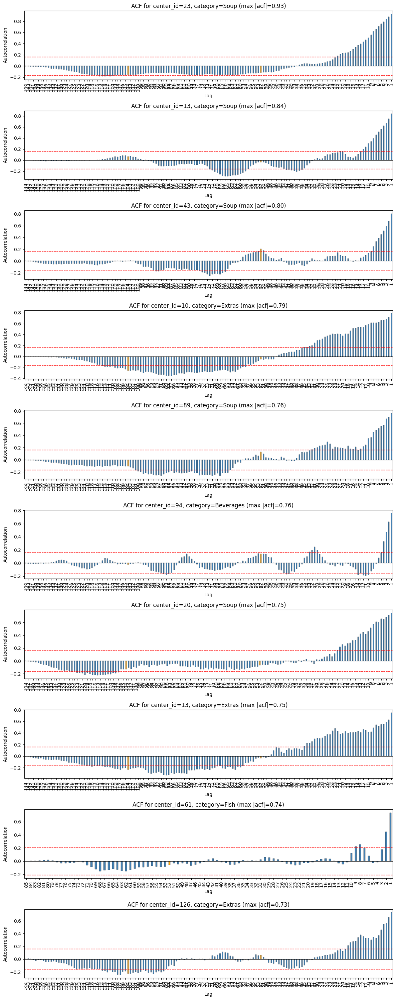

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import acf
import numpy as np

combo_orders = (
    train_df
    .groupby(['center_id', 'category', 'week'], as_index=False)['num_orders']
    .sum()
)

acf_scores = []

for (cid, cat), group in combo_orders.groupby(['center_id', 'category']):
    ts = group.sort_values('week')['num_orders'].reset_index(drop=True)
    if len(ts) > 2:
        acf_values = acf(ts, nlags=len(ts)-1, fft=True)
        max_acf = np.max(np.abs(acf_values[1:]))
        acf_scores.append({'center_id': cid, 'category': cat, 'max_acf': max_acf})

top10 = pd.DataFrame(acf_scores).nlargest(10, 'max_acf')

plt.figure(figsize=(12, len(top10)*3))

seasonal_lags = [52, 52*2, 52*3]

for i, row in enumerate(top10.itertuples(), 1):
    subset = combo_orders[
        (combo_orders['center_id'] == row.center_id) &
        (combo_orders['category'] == row.category)
    ].sort_values('week')

    ts = subset['num_orders'].reset_index(drop=True)
    T = len(ts)
    max_lag = T - 1
    acf_values = acf(ts, nlags=max_lag, fft=True)[1:]
    lags = np.arange(1, max_lag + 1)
    ci = 1.96 / np.sqrt(T)

    plt.subplot(len(top10), 1, i)
    colors = ['orange' if lag in seasonal_lags else 'steelblue' for lag in lags]
    plt.bar(lags, acf_values, width=0.4, color=colors, edgecolor='black', linewidth=0.3)
    plt.axhline(y=ci, color='red', linestyle='--', linewidth=1)
    plt.axhline(y=-ci, color='red', linestyle='--', linewidth=1)
    plt.axhline(y=0, color='black', linewidth=0.8)
    plt.xlim(max_lag + 0.5, 0.5)
    plt.xticks(lags, rotation=90)
    plt.title(f'ACF for center_id={row.center_id}, category={row.category} (max |acf|={row.max_acf:.2f})')
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')

plt.tight_layout()
plt.show()


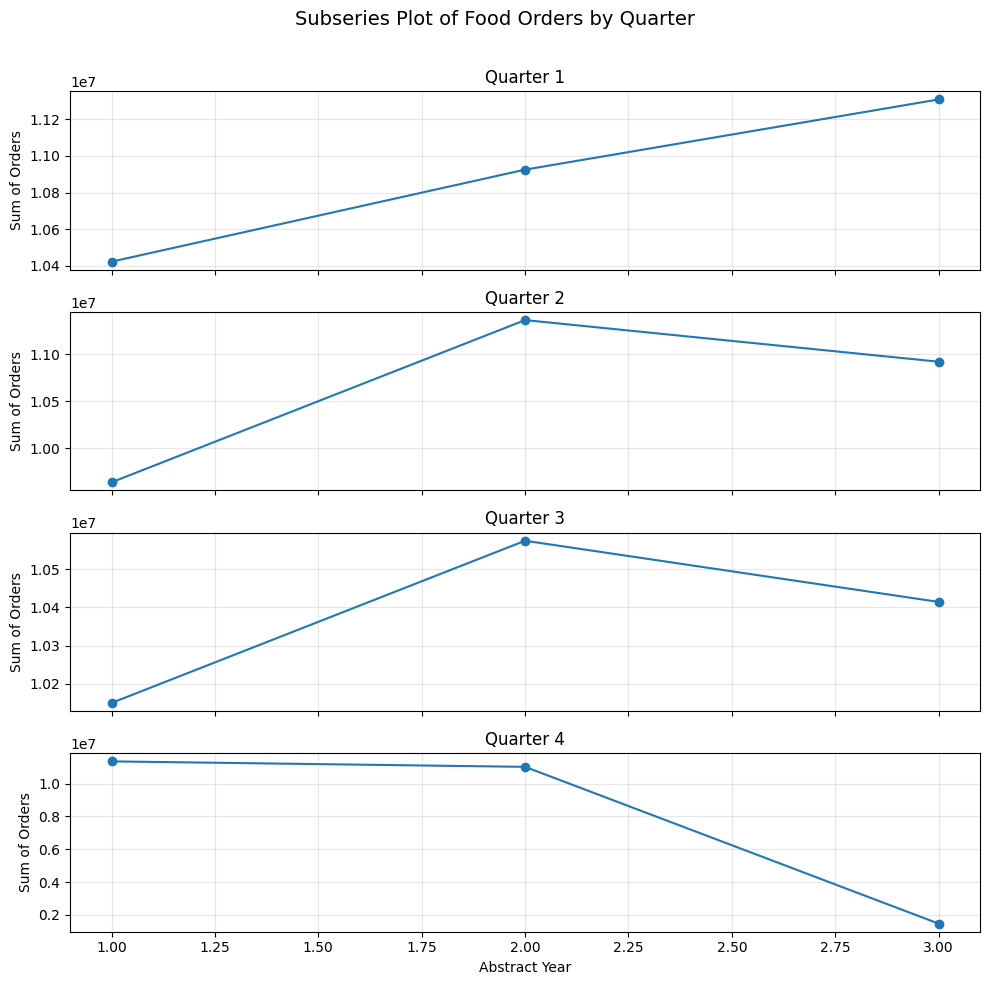

In [52]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure week is numeric
train_df['week'] = pd.to_numeric(train_df['week'], errors='coerce')

# Step 1: Create abstract year and quarter
train_df['year'] = ((train_df['week'] - 1) // 52 + 1).astype(int)
train_df['quarter'] = (((train_df['week'] - 1) % 52) // 13 + 1).astype(int)

# Step 2: Aggregate
agg_df = train_df.groupby(['year', 'quarter'], as_index=False)['num_orders'].sum()

# Step 3: Plot subseries — one subplot per quarter
quarters = sorted(agg_df['quarter'].unique())
n_quarters = len(quarters)

fig, axes = plt.subplots(n_quarters, 1, figsize=(10, 2.5 * n_quarters), sharex=True)

for i, q in enumerate(quarters):
    ax = axes[i] if n_quarters > 1 else axes
    q_df = agg_df[agg_df['quarter'] == q]
    ax.plot(q_df['year'], q_df['num_orders'], marker='o')
    ax.set_title(f'Quarter {q}')
    ax.set_ylabel('Sum of Orders')
    ax.grid(True, alpha=0.3)

axes[-1].set_xlabel('Abstract Year')
plt.suptitle('Subseries Plot of Food Orders by Quarter', fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


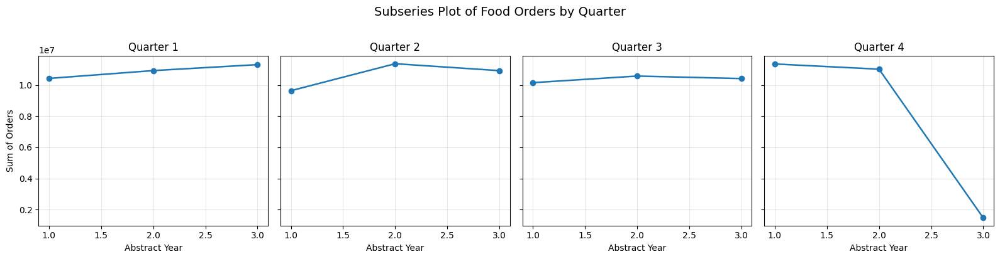

In [55]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure week is numeric
train_df['week'] = pd.to_numeric(train_df['week'], errors='coerce')

# Abstract year & quarter
train_df['year'] = ((train_df['week'] - 1) // 52 + 1).astype(int)
train_df['quarter'] = (((train_df['week'] - 1) % 52) // 13 + 1).astype(int)

# Aggregate by year and quarter
agg_df = train_df.groupby(['year', 'quarter'], as_index=False)['num_orders'].sum()

# Plot horizontally (each quarter = one column) with shared y-axis
quarters = sorted(agg_df['quarter'].unique())
n_quarters = len(quarters)

fig, axes = plt.subplots(1, n_quarters, figsize=(4 * n_quarters, 4), sharey=True)

for i, q in enumerate(quarters):
    ax = axes[i] if n_quarters > 1 else axes
    q_df = agg_df[agg_df['quarter'] == q]
    ax.plot(q_df['year'], q_df['num_orders'], marker='o', lw=1.8)
    ax.set_title(f'Quarter {q}', fontsize=12)
    ax.set_xlabel('Abstract Year')
    ax.grid(alpha=0.3)

axes[0].set_ylabel('Sum of Orders')  # Only label the first subplot for clarity

plt.suptitle('Subseries Plot of Food Orders by Quarter', fontsize=14, y=1.02)
plt.tight_layout()
plt.show()


AUTOCORRELATION ANALYSIS
Time series length: 145 weeks
Analysis lags: 52 (up to 1 year for weekly data)

Creating Lag Plots...

## 1. LAG PLOTS ANALYSIS
Interpreting lag plots:
• Tight scatter along diagonal = Strong autocorrelation
• Circular/random scatter = Weak autocorrelation
• Specific patterns = Non-linear relationships


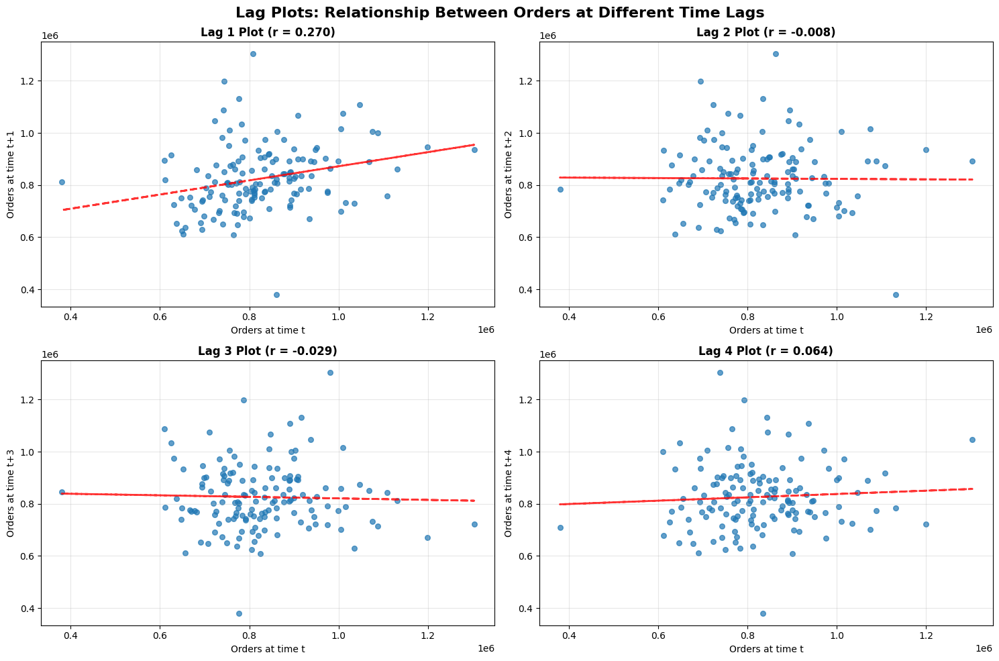


Creating ACF Plots...


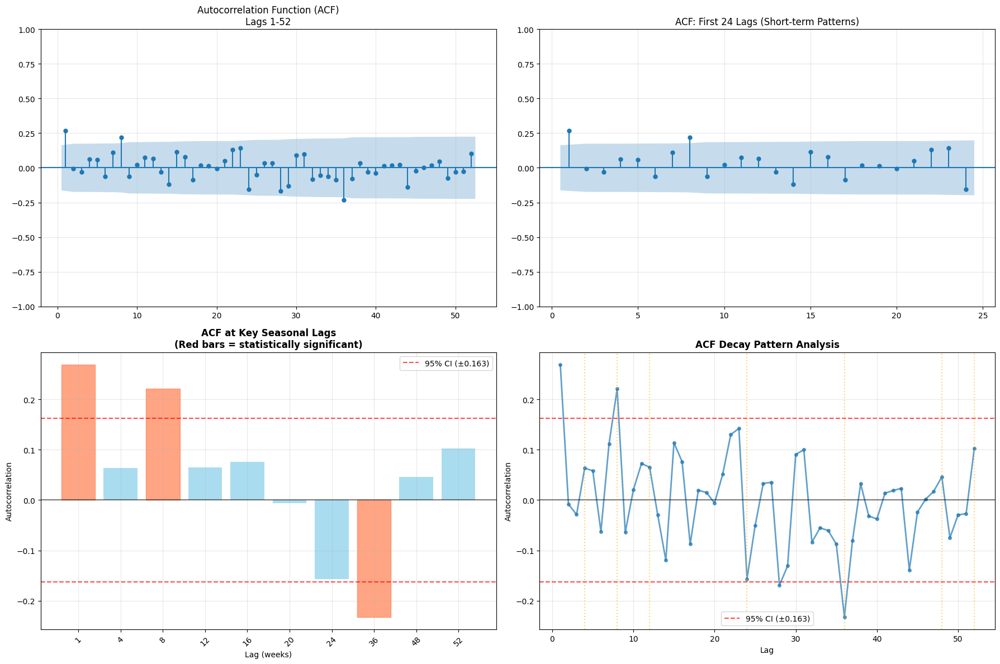


Creating PACF Plots...


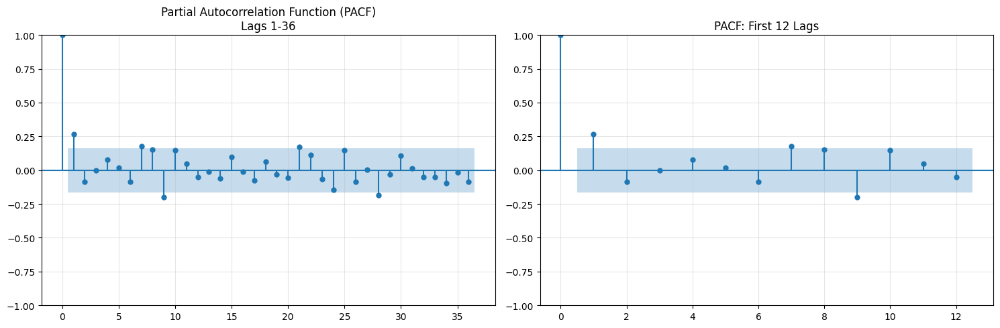


## 4. AUTOCORRELATION INTERPRETATION SUMMARY
AUTOCORRELATION ANALYSIS: KEY INSIGHTS

📈 TREND ANALYSIS:
• WEAK TREND: ACF decays quickly → More stationary series

🔄 SEASONALITY ANALYSIS:
• SEASONAL PATTERNS DETECTED at lags: [8, 36]
  - Lag 8: Bi-monthly pattern (ACF = 0.221)

⏱️  SHORT-TERM DEPENDENCIES:
• Significant short-term autocorrelations at lags: [1]
• Lag 1 correlation: 0.269 (Very strong if > 0.8)

📊 STATIONARITY ASSESSMENT:
• RELATIVELY STATIONARY: Few significant lags beyond confidence bounds

💡 MODELING RECOMMENDATIONS:
  1. Include seasonal components in model
  2. Include autoregressive terms (AR components)

📈 KEY STATISTICS:
• Series length: 145 observations
• Confidence bounds: ±0.163
• Significant ACF lags: 4 out of 52
• ACF decay ratio (lag10/lag1): 0.075


In [14]:
# Part 3: Autocorrelation Analysis

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pandas.plotting import lag_plot
from statsmodels.tsa.stattools import acf

def create_autocorrelation_analysis(df, target_col='num_orders', lags=52):
    """
    Comprehensive autocorrelation analysis for time series data
    """
    
    # Prepare the time series data (aggregate by week)
    weekly_series = df.groupby('week')[target_col].sum()
    
    print("="*70)
    print("AUTOCORRELATION ANALYSIS")
    print("="*70)
    print(f"Time series length: {len(weekly_series)} weeks")
    print(f"Analysis lags: {lags} (up to 1 year for weekly data)")
    
    return weekly_series

# Prepare data for autocorrelation analysis
weekly_series = create_autocorrelation_analysis(train_df)

# 1. LAG PLOTS for different lag values
def create_lag_plots(series, max_lag=4, figsize=(15, 10)):
    """
    Create multiple lag plots to visualize autocorrelation at different lags
    """
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    axes = axes.flatten()
    
    print("\n## 1. LAG PLOTS ANALYSIS")
    print("Interpreting lag plots:")
    print("• Tight scatter along diagonal = Strong autocorrelation")
    print("• Circular/random scatter = Weak autocorrelation") 
    print("• Specific patterns = Non-linear relationships")
    
    for i, lag in enumerate(range(1, max_lag + 1)):
        plt.sca(axes[i])
        lag_plot(series, lag=lag, alpha=0.7, s=30)
        
        # Calculate correlation coefficient
        corr = series.corr(series.shift(lag))
        
        plt.title(f'Lag {lag} Plot (r = {corr:.3f})', fontweight='bold')
        plt.xlabel(f'Orders at time t')
        plt.ylabel(f'Orders at time t+{lag}')
        plt.grid(True, alpha=0.3)
        
        # Add trend line
        x = series[:-lag] if lag < len(series) else series
        y = series[lag:] if lag < len(series) else series
        
        if len(x) > 0 and len(y) > 0:
            z = np.polyfit(x, y, 1)
            p = np.poly1d(z)
            plt.plot(x, p(x), "r--", alpha=0.8, linewidth=2)
    
    plt.suptitle('Lag Plots: Relationship Between Orders at Different Time Lags', 
                 fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return fig

print("\nCreating Lag Plots...")
lag_plots = create_lag_plots(weekly_series)

# 2. AUTOCORRELATION FUNCTION (ACF) PLOTS
def create_acf_analysis(series, lags=52, alpha=0.05):
    """
    Create comprehensive ACF analysis with multiple perspectives
    """
    fig = plt.figure(figsize=(18, 12))
    
    # 2.1 Standard ACF Plot
    plt.subplot(2, 2, 1)
    plot_acf(series, lags=lags, alpha=alpha, ax=plt.gca(), 
             title=f'Autocorrelation Function (ACF)\nLags 1-{lags}', 
             zero=False)
    plt.grid(True, alpha=0.3)
    
    # 2.2 ACF with different lag range to see patterns clearly
    plt.subplot(2, 2, 2)
    plot_acf(series, lags=24, alpha=alpha, ax=plt.gca(),
             title='ACF: First 24 Lags (Short-term Patterns)',
             zero=False)
    plt.grid(True, alpha=0.3)
    
    # 2.3 ACF for seasonal lags (focus on yearly pattern)
    plt.subplot(2, 2, 3)
    seasonal_lags = [1, 4, 8, 12, 16, 20, 24, 36, 48, 52]
    valid_lags = [lag for lag in seasonal_lags if lag <= lags]
    
    if valid_lags:
        acf_values = acf(series, nlags=max(valid_lags))
        seasonal_acf = [acf_values[lag] for lag in valid_lags]
        
        bars = plt.bar(range(len(valid_lags)), seasonal_acf, color='skyblue', alpha=0.7)
        plt.axhline(y=0, color='black', linestyle='-', alpha=0.5)
        
        # Add confidence intervals
        conf_bound = 1.96 / np.sqrt(len(series))
        plt.axhline(y=conf_bound, color='red', linestyle='--', alpha=0.7, 
                   label=f'95% CI (±{conf_bound:.3f})')
        plt.axhline(y=-conf_bound, color='red', linestyle='--', alpha=0.7)
        
        # Color significant bars
        for i, (lag, acf_val) in enumerate(zip(valid_lags, seasonal_acf)):
            if abs(acf_val) > conf_bound:
                bars[i].set_color('coral')
        
        plt.title('ACF at Key Seasonal Lags\n(Red bars = statistically significant)', 
                 fontweight='bold')
        plt.xlabel('Lag (weeks)')
        plt.ylabel('Autocorrelation')
        plt.xticks(range(len(valid_lags)), valid_lags, rotation=45)
        plt.legend()
        plt.grid(True, alpha=0.3)
    
    # 2.4 ACF Decay Analysis
    plt.subplot(2, 2, 4)
    all_acf_values = acf(series, nlags=lags)
    lags_range = range(1, lags + 1)
    
    plt.plot(lags_range, all_acf_values[1:], 'o-', alpha=0.7, linewidth=2, markersize=4)
    plt.axhline(y=0, color='black', linestyle='-', alpha=0.5)
    
    # Add confidence interval
    conf_bound = 1.96 / np.sqrt(len(series))
    plt.axhline(y=conf_bound, color='red', linestyle='--', alpha=0.7, 
               label=f'95% CI (±{conf_bound:.3f})')
    plt.axhline(y=-conf_bound, color='red', linestyle='--', alpha=0.7)
    
    # Highlight seasonal lags
    seasonal_points = [4, 8, 12, 24, 36, 48, 52]
    for point in seasonal_points:
        if point <= lags:
            plt.axvline(x=point, color='orange', linestyle=':', alpha=0.5)
    
    plt.title('ACF Decay Pattern Analysis', fontweight='bold')
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    return all_acf_values

print("\nCreating ACF Plots...")
acf_values = create_acf_analysis(weekly_series, lags=52)

# 3. PARTIAL AUTOCORRELATION FUNCTION (PACF) PLOT
def create_pacf_analysis(series, lags=36):
    """
    Create PACF plot to identify direct relationships
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # Full PACF
    plot_pacf(series, lags=lags, alpha=0.05, ax=ax1, 
              title=f'Partial Autocorrelation Function (PACF)\nLags 1-{lags}')
    ax1.grid(True, alpha=0.3)
    
    # First few lags for clarity
    plot_pacf(series, lags=min(12, lags), alpha=0.05, ax=ax2,
              title='PACF: First 12 Lags')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    return fig

print("\nCreating PACF Plots...")
pacf_plots = create_pacf_analysis(weekly_series)

# 4. AUTOCORRELATION INTERPRETATION AND INSIGHTS
def generate_autocorrelation_insights(series, acf_values, lags=52):
    """
    Generate automated insights from autocorrelation analysis
    """
    print("="*70)
    print("AUTOCORRELATION ANALYSIS: KEY INSIGHTS")
    print("="*70)
    
    conf_bound = 1.96 / np.sqrt(len(series))
    
    # Trend Analysis
    print("\n📈 TREND ANALYSIS:")
    
    # Check if ACF decays slowly (indication of trend)
    lag_1_acf = acf_values[1]
    lag_10_acf = acf_values[10] if len(acf_values) > 10 else acf_values[-1]
    decay_ratio = abs(lag_10_acf / lag_1_acf) if lag_1_acf != 0 else 0
    
    if decay_ratio > 0.5:
        print("• STRONG TREND PRESENT: ACF decays slowly → Non-stationary series")
        print("  → Consider differencing for modeling")
    elif decay_ratio > 0.2:
        print("• MODERATE TREND: Some persistence in ACF")
    else:
        print("• WEAK TREND: ACF decays quickly → More stationary series")
    
    # Seasonality Analysis
    print("\n🔄 SEASONALITY ANALYSIS:")
    
    # Check for weekly seasonality (lag 4, 8, 12 ≈ monthly patterns)
    seasonal_lags = [4, 8, 12, 24, 36, 48, 52]
    significant_seasonal = []
    
    for lag in seasonal_lags:
        if lag < len(acf_values):
            if abs(acf_values[lag]) > conf_bound:
                significant_seasonal.append(lag)
    
    if significant_seasonal:
        print(f"• SEASONAL PATTERNS DETECTED at lags: {significant_seasonal}")
        
        # Interpret seasonal lags
        seasonal_interpretation = {
            4: "Possible monthly pattern (every 4 weeks)",
            8: "Bi-monthly pattern",
            12: "Quarterly pattern (every 12 weeks)", 
            24: "Half-yearly pattern",
            52: "Yearly seasonal pattern"
        }
        
        for lag in significant_seasonal[:3]:  # Top 3 most significant
            if lag in seasonal_interpretation:
                print(f"  - Lag {lag}: {seasonal_interpretation[lag]} (ACF = {acf_values[lag]:.3f})")
    else:
        print("• NO STRONG SEASONALITY: No significant patterns at common seasonal lags")
    
    # Short-term Dependencies
    print("\n⏱️  SHORT-TERM DEPENDENCIES:")
    
    significant_short_term = []
    for lag in range(1, min(6, len(acf_values))):
        if abs(acf_values[lag]) > conf_bound:
            significant_short_term.append(lag)
    
    if significant_short_term:
        print(f"• Significant short-term autocorrelations at lags: {significant_short_term}")
        print(f"• Lag 1 correlation: {acf_values[1]:.3f} (Very strong if > 0.8)")
    else:
        print("• Weak short-term dependencies")
    
    # Stationarity Assessment
    print("\n📊 STATIONARITY ASSESSMENT:")
    
    # Count significant lags beyond what we'd expect by chance
    significant_lags = sum(1 for acf_val in acf_values[1:] if abs(acf_val) > conf_bound)
    expected_random = 0.05 * len(acf_values[1:])  # 5% should be significant by chance
    
    if significant_lags > expected_random * 2:
        print(f"• NON-STATIONARY: {significant_lags} significant lags (expected ~{expected_random:.1f} by chance)")
        print("  → Series has time-dependent structure")
    else:
        print("• RELATIVELY STATIONARY: Few significant lags beyond confidence bounds")
    
    # Modeling Recommendations
    print("\n💡 MODELING RECOMMENDATIONS:")
    
    recommendations = []
    
    if decay_ratio > 0.5:
        recommendations.append("Use differencing (ARIMA) to handle trend")
    
    if significant_seasonal:
        recommendations.append("Include seasonal components in model")
        if 52 in significant_seasonal:
            recommendations.append("Consider seasonal ARIMA with period=52")
    
    if significant_short_term:
        recommendations.append("Include autoregressive terms (AR components)")
    
    if not recommendations:
        recommendations.append("Simple models may suffice - weak dependencies")
    
    for i, rec in enumerate(recommendations, 1):
        print(f"  {i}. {rec}")
    
    # Key Statistics
    print("\n📈 KEY STATISTICS:")
    print(f"• Series length: {len(series)} observations")
    print(f"• Confidence bounds: ±{conf_bound:.3f}")
    print(f"• Significant ACF lags: {significant_lags} out of {lags}")
    print(f"• ACF decay ratio (lag10/lag1): {decay_ratio:.3f}")

print("\n## 4. AUTOCORRELATION INTERPRETATION SUMMARY")
generate_autocorrelation_insights(weekly_series, acf_values, lags=52)

# 5. COMPARATIVE ACF ANALYSIS BY CATEGORY (Optional)
def compare_acf_by_category(df, top_categories=3, lags=24):
    """
    Compare ACF patterns across different meal categories
    """
    print("\n" + "="*70)
    print("COMPARATIVE ACF ANALYSIS BY MEAL CATEGORY")
    print("="*70)
    
    # Get top categories by total orders
    category_totals = df.groupby('category')['num_orders'].sum().nlargest(top_categories)
    top_cats = category_totals.index.tolist()
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    axes = axes.flatten()
    
    for i, category in enumerate(top_cats):
        if i < len(axes):
            category_data = df[df['category'] == category]
            category_series = category_data.groupby('week')['num_orders'].sum()
            
            plot_acf(category_series, lags=lags, alpha=0.05, ax=axes[i],
                    title=f'ACF: {category}\n(Total: {category_totals[category]:,} orders)')
            axes[i].grid(True, alpha=0.3)
            
            # Calculate some stats
            if len(category_series) > 1:
                lag1_corr = category_series.corr(category_series.shift(1))
                print(f"• {category}: Lag-1 correlation = {lag1_corr:.3f}")
    
    plt.suptitle('Autocorrelation Patterns by Meal Category', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Uncomment to run category comparison
# print("\n## 5. CATEGORY-WISE ACF COMPARISON")
# compare_acf_by_category(train_df, top_categories=4)

# Assignment 3

=== FOOD DEMAND FORECASTING - VARIANCE STABILIZATION ANALYSIS ===

Dataframes loaded successfully!
Training data shape: (456548, 9)

Sample of Merged Training Data:
        id  week  center_id  meal_id  checkout_price  base_price  \
0  1379560     1         55     1885          136.83      152.29   
1  1466964     1         55     1993          136.83      135.83   
2  1346989     1         55     2539          134.86      135.86   
3  1338232     1         55     2139          339.50      437.53   
4  1448490     1         55     2631          243.50      242.50   

   emailer_for_promotion  homepage_featured  num_orders  city_code  \
0                      0                  0         177        647   
1                      0                  0         270        647   
2                      0                  0         189        647   
3                      0                  0          54        647   
4                      0                  0          40        647   

   re

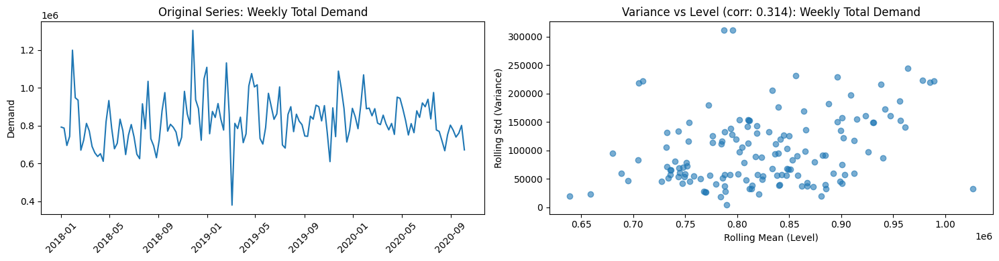

Variance Assessment for: Weekly Total Demand
→ STRONG indication for transformation (variance increases with level)


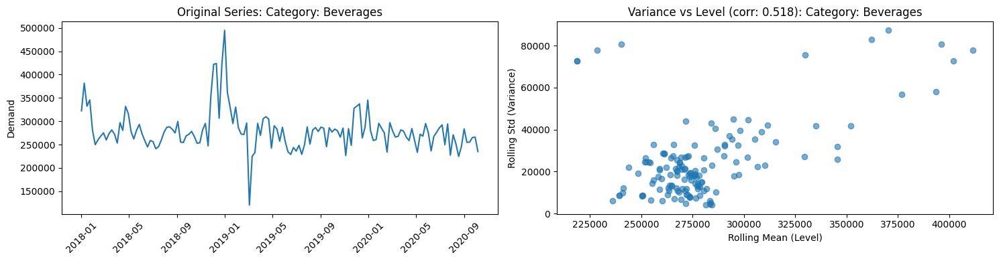

Variance Assessment for: Category: Beverages
→ STRONG indication for transformation (variance increases with level)


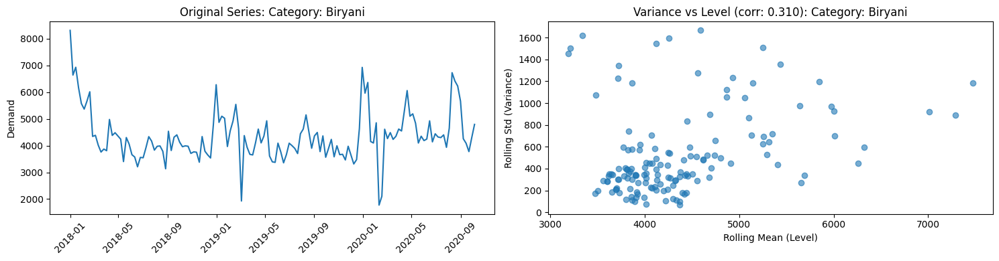

Variance Assessment for: Category: Biryani
→ STRONG indication for transformation (variance increases with level)


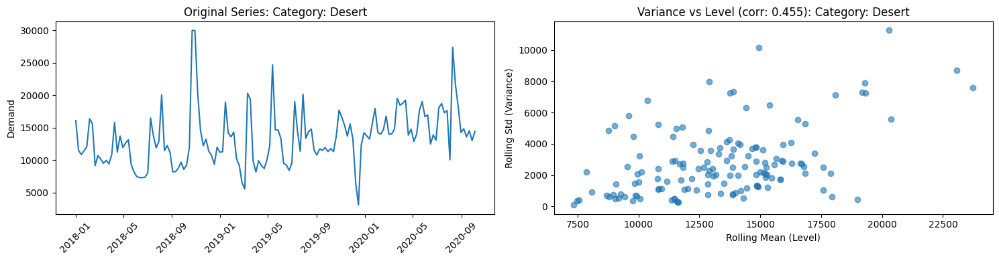

Variance Assessment for: Category: Desert
→ STRONG indication for transformation (variance increases with level)


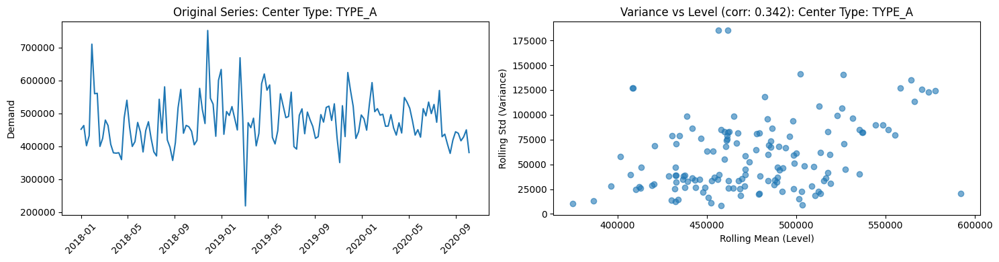

Variance Assessment for: Center Type: TYPE_A
→ STRONG indication for transformation (variance increases with level)


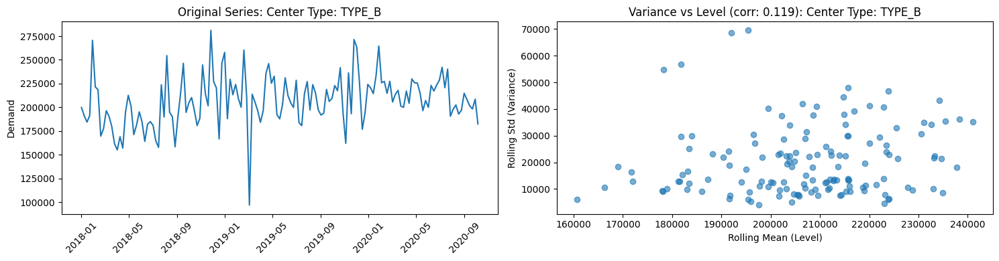

Variance Assessment for: Center Type: TYPE_B
→ MODERATE indication for transformation

PART 3: APPLY TRANSFORMATIONS
=== TRANSFORMATION ANALYSIS ===

Applying transformations to: Weekly Total Demand


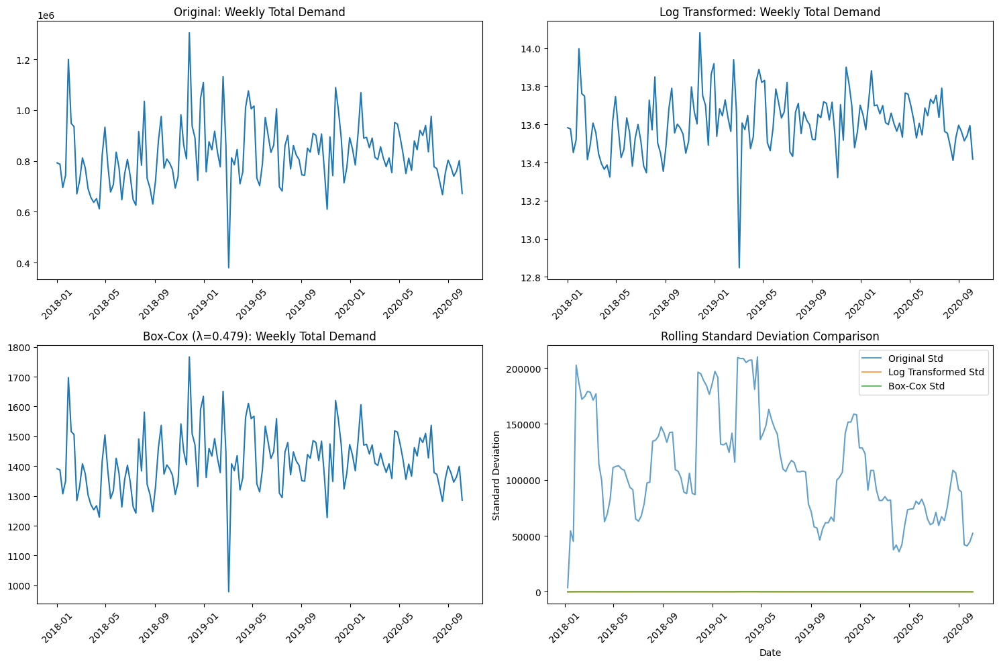

Transformation Results for: Weekly Total Demand
Original Coefficient of Variation: 0.1524
Log Transformed Coefficient of Variation: 0.0113
Variance Reduction: 92.6%


Applying transformations to: Category: Beverages


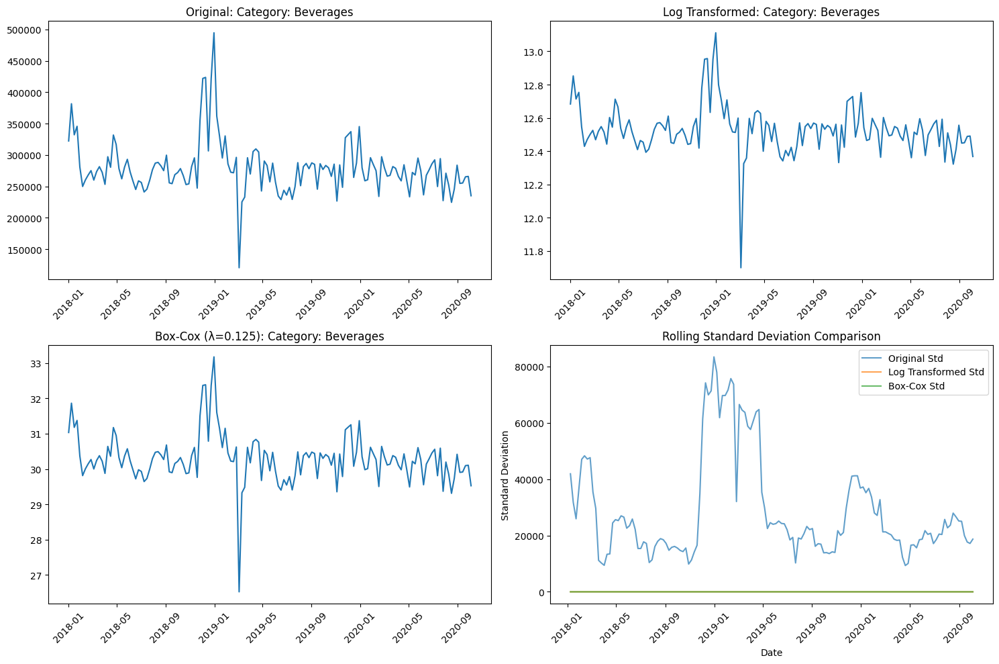

Transformation Results for: Category: Beverages
Original Coefficient of Variation: 0.1501
Log Transformed Coefficient of Variation: 0.0116
Variance Reduction: 92.3%


Applying transformations to: Category: Biryani


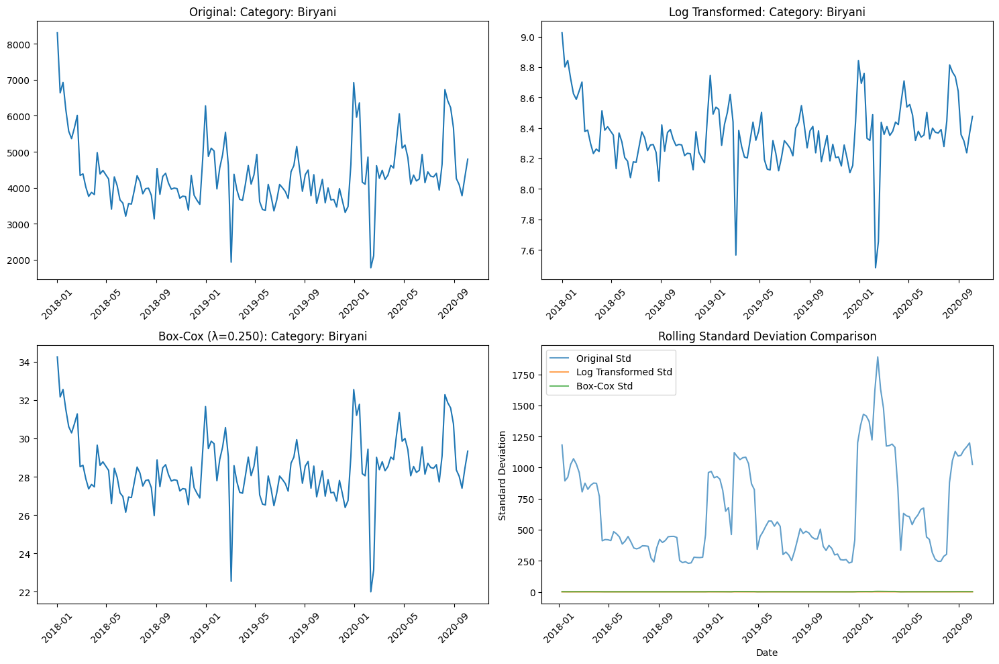

Transformation Results for: Category: Biryani
Original Coefficient of Variation: 0.2138
Log Transformed Coefficient of Variation: 0.0253
Variance Reduction: 88.2%


PART 4: INTERPRETATION & SUMMARY

=== FINAL TRANSFORMATION SUMMARY ===
             Series  Correlation  Needs Transformation Priority  Mean Demand  Coefficient of Variation                            Recommendation
Category: Beverages        0.518                  True     High    279176.03                    0.1501 STRONGLY RECOMMEND Box-Cox transformation
   Category: Desert        0.455                  True     High     13384.51                    0.3234 STRONGLY RECOMMEND Box-Cox transformation
Center Type: TYPE_A        0.342                  True     High    475713.91                    0.1532 STRONGLY RECOMMEND Box-Cox transformation
Weekly Total Demand        0.314                  True     High    824534.38                    0.1524 STRONGLY RECOMMEND Box-Cox transformation
  Category: Biryani        0.310       

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import os

# =============================================================================
# PART 0: DATA LOADING AND SETUP
# =============================================================================

print("=== FOOD DEMAND FORECASTING - VARIANCE STABILIZATION ANALYSIS ===\n")

# Load the data
data_dir = '/kaggle/input/food-demand-forecasting'

try:
    train_df = pd.read_csv(os.path.join(data_dir, 'train.csv'))
    test_df = pd.read_csv(os.path.join(data_dir, 'test.csv'))
    center_info_df = pd.read_csv(os.path.join(data_dir, 'fulfilment_center_info.csv'))
    meal_info_df = pd.read_csv(os.path.join(data_dir, 'meal_info.csv'))

    print("Dataframes loaded successfully!")
    print(f"Training data shape: {train_df.shape}")
    
    # Merge datasets
    train_df = pd.merge(train_df, center_info_df, on='center_id', how='left')
    train_df = pd.merge(train_df, meal_info_df, on='meal_id', how='left')
    
    test_df = pd.merge(test_df, center_info_df, on='center_id', how='left')
    test_df = pd.merge(test_df, meal_info_df, on='meal_id', how='left')

    print("\nSample of Merged Training Data:")
    print(train_df.head())

except FileNotFoundError:
    print(f"\nError: Could not find files in the '{data_dir}' directory.")
    print("Please ensure the Kaggle API download command in Step 1 ran correctly.")

print("\nColumns in training data:", train_df.columns.tolist())

# =============================================================================
# PART 1: DATA PREPARATION & TIME SERIES CREATION
# =============================================================================

print("\n" + "="*60)
print("PART 1: DATA PREPARATION & TIME SERIES CREATION")
print("="*60)

# Check the week column format
print("Unique week values sample:", train_df['week'].unique()[:10])
print("Week column dtype:", train_df['week'].dtype)

def create_date_from_week(week_num, base_date='2018-01-01'):
    """Convert week number to actual date starting from base_date"""
    base = pd.to_datetime(base_date)
    return base + pd.to_timedelta((week_num - 1) * 7, unit='D')

# Convert week numbers to proper dates
train_df['date'] = create_date_from_week(train_df['week'])
test_df['date'] = create_date_from_week(test_df['week'])

# Sort by date
train_df = train_df.sort_values('date')
test_df = test_df.sort_values('date')

print("Date conversion completed!")
print(f"Date range: {train_df['date'].min()} to {train_df['date'].max()}")

# Create different aggregated time series for analysis
weekly_total = train_df.groupby('date')['num_orders'].sum()

# By category
category_demand = train_df.groupby(['date', 'category'])['num_orders'].sum().unstack()

# By center type  
center_type_demand = train_df.groupby(['date', 'center_type'])['num_orders'].sum().unstack()

# By cuisine
cuisine_demand = train_df.groupby(['date', 'cuisine'])['num_orders'].sum().unstack()

print("\nTime series created successfully!")
print(f"Weekly total shape: {weekly_total.shape}")
print(f"Categories: {category_demand.columns.tolist()}")
print(f"Center types: {center_type_demand.columns.tolist()}")
print(f"Cuisines: {cuisine_demand.columns.tolist()}")

# =============================================================================
# PART 2: ASSESS NEED FOR TRANSFORMATION
# =============================================================================

print("\n" + "="*60)
print("PART 2: ASSESS NEED FOR TRANSFORMATION")
print("="*60)

def assess_variance(series, title):
    """Assess whether variance changes with series level"""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4))
    
    # Original series
    ax1.plot(series.index, series.values)
    ax1.set_title(f'Original Series: {title}')
    ax1.set_ylabel('Demand')
    ax1.tick_params(axis='x', rotation=45)
    
    # Check for variance pattern (remove NaN values for correlation)
    rolling_mean = series.rolling(window=4, min_periods=1).mean()
    rolling_std = series.rolling(window=4, min_periods=1).std()
    
    # Remove NaN values for plotting and correlation
    valid_idx = ~rolling_mean.isna() & ~rolling_std.isna()
    if valid_idx.sum() > 0:
        corr = np.corrcoef(rolling_mean[valid_idx], rolling_std[valid_idx])[0,1]
        ax2.scatter(rolling_mean[valid_idx], rolling_std[valid_idx], alpha=0.6)
        ax2.set_title(f'Variance vs Level (corr: {corr:.3f}): {title}')
        ax2.set_xlabel('Rolling Mean (Level)')
        ax2.set_ylabel('Rolling Std (Variance)')
    
    plt.tight_layout()
    plt.show()
    
    # Interpretation guidance
    print(f"Variance Assessment for: {title}")
    if 'corr' in locals() and corr > 0.3:
        print("→ STRONG indication for transformation (variance increases with level)")
        needs_transform = True
    elif 'corr' in locals() and corr > 0.1:
        print("→ MODERATE indication for transformation")
        needs_transform = True
    else:
        print("→ WEAK indication for transformation (variance relatively stable)")
        needs_transform = False
    
    return {'series_name': title, 'correlation': corr, 'needs_transform': needs_transform}

# Apply assessment to our series
assessment_results = []

print("=== VARIANCE ASSESSMENT ===")
result = assess_variance(weekly_total, "Weekly Total Demand")
assessment_results.append(result)

# Assess categories
for col in category_demand.columns[:3]:  # First 3 categories
    result = assess_variance(category_demand[col], f"Category: {col}")
    assessment_results.append(result)

# Assess center types
for col in center_type_demand.columns[:2]:  # First 2 center types
    result = assess_variance(center_type_demand[col], f"Center Type: {col}")
    assessment_results.append(result)

# =============================================================================
# PART 3: APPLY TRANSFORMATIONS
# =============================================================================

print("\n" + "="*60)
print("PART 3: APPLY TRANSFORMATIONS")
print("="*60)

def apply_transformations(series, series_name):
    """Apply and compare different variance-stabilizing transformations"""
    
    # Ensure series is positive for Box-Cox
    series_positive = series[series > 0]
    if len(series_positive) < len(series):
        print(f"Warning: {len(series) - len(series_positive)} zero/negative values removed for Box-Cox")
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
    # Original series
    axes[0,0].plot(series.index, series.values)
    axes[0,0].set_title(f'Original: {series_name}')
    axes[0,0].tick_params(axis='x', rotation=45)
    
    # Log transformation (handle zeros with log1p)
    log_transformed = np.log1p(series)  # log(1 + x)
    axes[0,1].plot(series.index, log_transformed)
    axes[0,1].set_title(f'Log Transformed: {series_name}')
    axes[0,1].tick_params(axis='x', rotation=45)
    
    # Box-Cox transformation (only on positive values)
    if len(series_positive) > 0:
        boxcox_transformed, fitted_lambda = stats.boxcox(series_positive)
        # Create a series for Box-Cox results
        boxcox_series = pd.Series(boxcox_transformed, index=series_positive.index)
        axes[1,0].plot(boxcox_series.index, boxcox_series.values)
        axes[1,0].set_title(f'Box-Cox (λ={fitted_lambda:.3f}): {series_name}')
    else:
        boxcox_series = None
        fitted_lambda = None
        axes[1,0].text(0.5, 0.5, 'No positive values\nfor Box-Cox', 
                      ha='center', va='center', transform=axes[1,0].transAxes)
        axes[1,0].set_title(f'Box-Cox: {series_name}')
    
    axes[1,0].tick_params(axis='x', rotation=45)
    
    # Compare variance stability using rolling standard deviation
    window = min(8, len(series)//4)  # Adaptive window size
    original_std = series.rolling(window=window, min_periods=1).std()
    log_std = log_transformed.rolling(window=window, min_periods=1).std()
    
    axes[1,1].plot(series.index, original_std, label='Original Std', alpha=0.7)
    axes[1,1].plot(series.index, log_std, label='Log Transformed Std', alpha=0.7)
    if boxcox_series is not None:
        boxcox_std = boxcox_series.rolling(window=window, min_periods=1).std()
        axes[1,1].plot(boxcox_series.index, boxcox_std, label='Box-Cox Std', alpha=0.7)
    
    axes[1,1].set_title('Rolling Standard Deviation Comparison')
    axes[1,1].set_xlabel('Date')
    axes[1,1].set_ylabel('Standard Deviation')
    axes[1,1].legend()
    axes[1,1].tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()
    
    # Calculate variance improvement
    original_cv = series.std() / series.mean() if series.mean() > 0 else 0
    log_cv = log_transformed.std() / log_transformed.mean() if log_transformed.mean() > 0 else 0
    
    print(f"Transformation Results for: {series_name}")
    print(f"Original Coefficient of Variation: {original_cv:.4f}")
    print(f"Log Transformed Coefficient of Variation: {log_cv:.4f}")
    if original_cv > 0:
        improvement = (original_cv - log_cv) / original_cv * 100
        print(f"Variance Reduction: {improvement:.1f}%")
    print()
    
    return log_transformed, boxcox_series, fitted_lambda

# Apply transformations to series that need them
print("=== TRANSFORMATION ANALYSIS ===")
transformation_results = {}

# Apply to weekly total and series that showed variance issues
series_to_transform = [result for result in assessment_results if result['needs_transform']]

for result in series_to_transform[:3]:  # Transform first 3 series that need it
    series_name = result['series_name']
    print(f"\nApplying transformations to: {series_name}")
    
    # Get the actual series data
    if series_name == "Weekly Total Demand":
        series_data = weekly_total
    elif series_name.startswith("Category:"):
        category_name = series_name.split(": ")[1]
        series_data = category_demand[category_name]
    elif series_name.startswith("Center Type:"):
        center_type_name = series_name.split(": ")[1]
        series_data = center_type_demand[center_type_name]
    else:
        continue
    
    log_data, boxcox_data, lambda_val = apply_transformations(series_data, series_name)
    transformation_results[series_name] = {
        'log_transformed': log_data,
        'boxcox_transformed': boxcox_data,
        'lambda': lambda_val
    }

# =============================================================================
# PART 4: INTERPRETATION & SUMMARY
# =============================================================================

print("\n" + "="*60)
print("PART 4: INTERPRETATION & SUMMARY")
print("="*60)

def create_final_summary(assessment_results, transformation_results):
    """Create comprehensive summary of the analysis"""
    
    summary_data = []
    
    for result in assessment_results:
        series_name = result['series_name']
        
        # Get basic stats
        if series_name == "Weekly Total Demand":
            series_data = weekly_total
        elif series_name.startswith("Category:"):
            category_name = series_name.split(": ")[1]
            series_data = category_demand[category_name]
        elif series_name.startswith("Center Type:"):
            center_type_name = series_name.split(": ")[1]
            series_data = center_type_demand[center_type_name]
        else:
            continue
        
        # Calculate statistics
        mean_val = series_data.mean()
        std_val = series_data.std()
        cv = std_val / mean_val if mean_val > 0 else 0
        
        # Determine recommendation
        if result['needs_transform']:
            if result['correlation'] > 0.3:
                recommendation = "STRONGLY RECOMMEND Box-Cox transformation"
                priority = "High"
            else:
                recommendation = "RECOMMEND Log transformation"
                priority = "Medium"
        else:
            recommendation = "No transformation needed"
            priority = "Low"
        
        summary_data.append({
            'Series': series_name,
            'Correlation': round(result['correlation'], 3),
            'Needs Transformation': result['needs_transform'],
            'Priority': priority,
            'Mean Demand': round(mean_val, 2),
            'Coefficient of Variation': round(cv, 4),
            'Recommendation': recommendation
        })
    
    return pd.DataFrame(summary_data)

# Create and display final summary
final_summary = create_final_summary(assessment_results, transformation_results)
print("\n=== FINAL TRANSFORMATION SUMMARY ===")
print(final_summary.sort_values('Correlation', ascending=False).to_string(index=False))

# Key insights
print("\n=== KEY INSIGHTS ===")
high_priority = final_summary[final_summary['Priority'] == 'High']
if len(high_priority) > 0:
    print("HIGH PRIORITY for transformation:")
    for _, row in high_priority.iterrows():
        print(f"  - {row['Series']} (correlation: {row['Correlation']})")

medium_priority = final_summary[final_summary['Priority'] == 'Medium']
if len(medium_priority) > 0:
    print("\nMEDIUM PRIORITY for transformation:")
    for _, row in medium_priority.iterrows():
        print(f"  - {row['Series']} (correlation: {row['Correlation']})")

print("\n=== NEXT STEPS ===")
print("1. Apply recommended transformations to high/medium priority series")
print("2. Use transformed data for time series modeling")
print("3. Compare model performance with vs without transformations")
print("4. Consider seasonal decomposition after transformation")

print("\n" + "="*60)
print("ANALYSIS COMPLETED SUCCESSFULLY!")
print("="*60)

# Assignment 4

In [18]:
import pandas as pd
import numpy as np


print("Data overview:")
print(f"Total number of records: {len(train_df)}")
print(f"Week range: {train_df['week'].min()} to {train_df['week'].max()}")
print(f"Number of unique weeks: {train_df['week'].nunique()}")


time_series_combinations = train_df[['center_id', 'meal_id']].drop_duplicates()
print(f"\nNumber of unique time series (center_id + meal_id): {len(time_series_combinations)}")


train_df = train_df.sort_values(['center_id', 'meal_id', 'week'])


total_weeks = train_df['week'].nunique()
print(f"\nTotal number of weeks in dataset: {total_weeks}")


seasonal_cycle = 52
test_size_weeks = max(seasonal_cycle, int(total_weeks * 0.2)) 

print(f"Test set size: {test_size_weeks} weeks (one seasonal cycle)")

# Split each time series individually
def split_time_series(group):
    """Split individual time series into train/test"""
    group = group.sort_values('week')
    n_obs = len(group)
    
    min_train_size = max(1, int(n_obs * 0.3))
    split_point = n_obs - min(test_size_weeks, n_obs - min_train_size)
    
    train = group.iloc[:split_point]
    test = group.iloc[split_point:]
    
    return train, test


train_parts = []
test_parts = []

for (center_id, meal_id), group in train_df.groupby(['center_id', 'meal_id']):
    train_part, test_part = split_time_series(group)
    train_parts.append(train_part)
    test_parts.append(test_part)

# Combine all parts
train_set = pd.concat(train_parts, ignore_index=True)
test_set = pd.concat(test_parts, ignore_index=True)

print(f"\nSplit Results:")
print(f"Training set week range: {train_set['week'].min()} to {train_set['week'].max()}")
print(f"Training set size: {len(train_set)} records ({len(train_set)/len(train_df)*100:.1f}%)")
print(f"Test set week range: {test_set['week'].min()} to {test_set['week'].max()}")
print(f"Test set size: {len(test_set)} records ({len(test_set)/len(train_df)*100:.1f}%)")


train_series = train_set[['center_id', 'meal_id']].drop_duplicates()
test_series = test_set[['center_id', 'meal_id']].drop_duplicates()
print(f"\nTime series in training set: {len(train_series)}")
print(f"Time series in test set: {len(test_series)}")


missing_in_test = train_series.merge(test_series, on=['center_id', 'meal_id'], how='left', indicator=True)
missing_in_test = missing_in_test[missing_in_test['_merge'] == 'left_only']
print(f"Time series missing in test set: {len(missing_in_test)}")


print(f"\nSample time series splits:")
sample_series = list(train_df.groupby(['center_id', 'meal_id']).groups.keys())[:3]
for center_id, meal_id in sample_series:
    train_weeks = train_set[(train_set['center_id'] == center_id) & (train_set['meal_id'] == meal_id)]['week']
    test_weeks = test_set[(test_set['center_id'] == center_id) & (test_set['meal_id'] == meal_id)]['week']
    print(f"Series ({center_id}, {meal_id}): Train weeks {len(train_weeks)}, Test weeks {len(test_weeks)}")
    print(f"  Train: {train_weeks.min()} to {train_weeks.max()}")
    print(f"  Test:  {test_weeks.min()} to {test_weeks.max()}")

Data overview:
Total number of records: 456548
Week range: 1 to 145
Number of unique weeks: 145

Number of unique time series (center_id + meal_id): 3597

Total number of weeks in dataset: 145
Test set size: 52 weeks (one seasonal cycle)

Split Results:
Training set week range: 1 to 139
Training set size: 274820 records (60.2%)
Test set week range: 2 to 145
Test set size: 181728 records (39.8%)

Time series in training set: 3597
Time series in test set: 3594
Time series missing in test set: 3

Sample time series splits:
Series (10, 1062): Train weeks 93, Test weeks 52
  Train: 1 to 93
  Test:  94 to 145
Series (10, 1109): Train weeks 93, Test weeks 52
  Train: 1 to 93
  Test:  94 to 145
Series (10, 1198): Train weeks 93, Test weeks 52
  Train: 1 to 93
  Test:  94 to 145


In [19]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

def generate_benchmark_forecasts(train_series, test_series, seasonal_period=52):
    """
    Generate forecasts using benchmark methods for a single time series
    
    Parameters:
    - train_series: pandas Series with training data (sorted by week)
    - test_series: pandas Series with test data (sorted by week)
    - seasonal_period: seasonal period for seasonal naive (default 52 for yearly seasonality)
    
    Returns:
    - Dictionary with forecasts from all methods
    """
    forecasts = {}
    

    mean_forecast = np.mean(train_series)
    forecasts['mean'] = np.full(len(test_series), mean_forecast)

    naive_forecast = train_series.iloc[-1]
    forecasts['naive'] = np.full(len(test_series), naive_forecast)
    

    if len(train_series) >= seasonal_period:
        seasonal_naive_forecasts = []
        for i in range(len(test_series)):
            seasonal_index = -seasonal_period + (i % seasonal_period)
            forecast_val = train_series.iloc[seasonal_index]
            seasonal_naive_forecasts.append(forecast_val)
        forecasts['seasonal_naive'] = seasonal_naive_forecasts
    else:
        forecasts['seasonal_naive'] = np.full(len(test_series), naive_forecast)
    
    if len(train_series) > 1:
        total_change = train_series.iloc[-1] - train_series.iloc[0]
        avg_change = total_change / (len(train_series) - 1)
        
        drift_forecasts = []
        for i in range(1, len(test_series) + 1):
            forecast_val = train_series.iloc[-1] + avg_change * i
            drift_forecasts.append(forecast_val)
        forecasts['drift'] = drift_forecasts
    else:
        forecasts['drift'] = np.full(len(test_series), naive_forecast)
    
    return forecasts

def calculate_metrics(actual, predicted, method_name):
    """Calculate evaluation metrics for forecasts"""
    mse = mean_squared_error(actual, predicted)
    mae = mean_absolute_error(actual, predicted)
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    
    return {
        'method': method_name,
        'mse': mse,
        'mae': mae,
        'mape': mape
    }


print("Generating benchmark forecasts for all time series...")


all_forecasts = {}
model_results = []


for (center_id, meal_id), group in train_df.groupby(['center_id', 'meal_id']):
    # Sort by week to ensure chronological order
    group = group.sort_values('week')
    

    n_obs = len(group)
    split_point = n_obs - min(test_size_weeks, n_obs - 1)
    
    train_data = group.iloc[:split_point]
    test_data = group.iloc[split_point:]
    

    if len(test_data) == 0:
        continue
    

    train_series = train_data['num_orders']
    test_series = test_data['num_orders']
    

    series_key = f"center_{center_id}_meal_{meal_id}"
    forecasts = generate_benchmark_forecasts(train_series, test_series)
    

    all_forecasts[series_key] = {
        'train': train_series,
        'test': test_series,
        'forecasts': forecasts
    }
    

    for method, pred in forecasts.items():
        metrics = calculate_metrics(test_series.values, pred, method)
        metrics.update({
            'center_id': center_id,
            'meal_id': meal_id,
            'train_weeks': len(train_series),
            'test_weeks': len(test_series)
        })
        model_results.append(metrics)

# Convert results to DataFrame
results_df = pd.DataFrame(model_results)

# Display overall performance by method
print("\n" + "="*60)
print("OVERALL PERFORMANCE BY METHOD (Average across all series)")
print("="*60)

overall_performance = results_df.groupby('method').agg({
    'mse': 'mean',
    'mae': 'mean', 
    'mape': 'mean'
}).round(2)

print(overall_performance)

# Display sample forecasts for a few series
print("\n" + "="*60)
print("SAMPLE FORECASTS FOR FIRST 3 TIME SERIES")
print("="*60)

sample_series = list(all_forecasts.keys())[:3]
for series_key in sample_series:
    print(f"\n{series_key}:")
    series_data = all_forecasts[series_key]
    test_actual = series_data['test'].values
    
    for method in ['mean', 'naive', 'seasonal_naive', 'drift']:
        if method in series_data['forecasts']:
            pred = series_data['forecasts'][method]
            mape = np.mean(np.abs((test_actual - pred) / test_actual)) * 100
            print(f"  {method:15s}: MAPE = {mape:.1f}%")


print("\n" + "="*60)
print("METHOD PERFORMANCE COMPARISON")
print("="*60)


best_methods = []
for (center_id, meal_id), group in results_df.groupby(['center_id', 'meal_id']):
    best_method = group.loc[group['mape'].idxmin()]
    best_methods.append(best_method)

best_methods_df = pd.DataFrame(best_methods)
method_counts = best_methods_df['method'].value_counts()

print("\nNumber of series where each method performed best (lowest MAPE):")
for method, count in method_counts.items():
    print(f"  {method:15s}: {count:3d} series")


results_df.to_csv('benchmark_forecast_results.csv', index=False)
print(f"\nResults saved to 'benchmark_forecast_results.csv'")

Generating benchmark forecasts for all time series...

OVERALL PERFORMANCE BY METHOD (Average across all series)
                      mse     mae    mape
method                                   
drift           120857.26  165.95  135.08
mean             58722.31  107.61   80.44
naive            91741.69  136.92  102.59
seasonal_naive  110797.59  135.62   91.33

SAMPLE FORECASTS FOR FIRST 3 TIME SERIES

center_10_meal_1062:
  mean           : MAPE = 23.3%
  naive          : MAPE = 25.7%
  seasonal_naive : MAPE = 30.0%
  drift          : MAPE = 28.3%

center_10_meal_1109:
  mean           : MAPE = 32.2%
  naive          : MAPE = 33.1%
  seasonal_naive : MAPE = 34.5%
  drift          : MAPE = 53.4%

center_10_meal_1198:
  mean           : MAPE = 36.3%
  naive          : MAPE = 36.7%
  seasonal_naive : MAPE = 40.2%
  drift          : MAPE = 42.6%

METHOD PERFORMANCE COMPARISON

Number of series where each method performed best (lowest MAPE):
  mean           : 1458 series
  naive        

In [21]:

from statsmodels.tsa.seasonal import STL
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

def stl_decomposition_forecasting(train_series, test_series, seasonal_period=52):


    if len(train_series) < 2 * seasonal_period:
        return generate_simple_fallback(train_series, test_series)
    
    try:

        stl = STL(train_series, period=seasonal_period, robust=True)
        result = stl.fit()
        

        seasonal = result.seasonal
        trend = result.trend
        remainder = result.resid

        seasonally_adjusted = trend + remainder
        

        seasonal_forecasts = []
        for i in range(len(test_series)):
            seasonal_index = -seasonal_period + (i % seasonal_period)
            seasonal_forecast = seasonal.iloc[seasonal_index]
            seasonal_forecasts.append(seasonal_forecast)
        

        trend_slope = calculate_trend_strength(trend)
        
        if trend_slope > 0.1: 
            sa_forecasts = drift_forecast(seasonally_adjusted, len(test_series))
            method_used = "drift"
        else:
            sa_forecasts = naive_forecast(seasonally_adjusted, len(test_series))
            method_used = "naive"
        
        # Combine forecasts
        final_forecasts = np.array(sa_forecasts) + np.array(seasonal_forecasts)
        
        return {
            'forecasts': final_forecasts,
            'components': {
                'seasonal': seasonal,
                'trend': trend,
                'remainder': remainder,
                'seasonally_adjusted': seasonally_adjusted
            },
            'method_used': method_used,
            'trend_strength': trend_slope
        }
        
    except Exception as e:
        print(f"STL decomposition failed: {e}")
        return generate_simple_fallback(train_series, test_series)

def calculate_trend_strength(trend_component):
    """Calculate the strength of trend based on slope"""
    if len(trend_component) < 2:
        return 0
    
    # Calculate normalized slope
    x = np.arange(len(trend_component))
    slope = (trend_component.iloc[-1] - trend_component.iloc[0]) / len(trend_component)
    range_val = np.max(trend_component) - np.min(trend_component)
    
    if range_val == 0:
        return 0
    
    trend_strength = abs(slope) / range_val if range_val > 0 else 0
    return trend_strength

def drift_forecast(series, horizon):
    """Drift method forecast for seasonally adjusted component"""
    if len(series) < 2:
        return [series.iloc[-1]] * horizon
    
    total_change = series.iloc[-1] - series.iloc[0]
    avg_change = total_change / (len(series) - 1)
    
    forecasts = []
    for i in range(1, horizon + 1):
        forecast_val = series.iloc[-1] + avg_change * i
        forecasts.append(forecast_val)
    
    return forecasts

def naive_forecast(series, horizon):
    """Naïve method forecast for seasonally adjusted component"""
    last_value = series.iloc[-1]
    return [last_value] * horizon

def generate_simple_fallback(train_series, test_series):
    """Fallback method if STL fails"""
    naive_fc = naive_forecast(train_series, len(test_series))
    return {
        'forecasts': naive_fc,
        'components': None,
        'method_used': 'naive_fallback',
        'trend_strength': 0
    }


print("Performing STL decomposition and component-based forecasting...")

stl_results = []
component_analysis = []

for (center_id, meal_id), group in train_df.groupby(['center_id', 'meal_id']):
    # Sort by week
    group = group.sort_values('week')
    
    # Split into train and test
    n_obs = len(group)
    split_point = n_obs - min(test_size_weeks, n_obs - 1)
    
    train_data = group.iloc[:split_point]
    test_data = group.iloc[split_point:]
    
    if len(test_data) == 0:
        continue
    
    train_series = train_data['num_orders']
    test_series = test_data['num_orders']
    
    # Perform STL decomposition forecasting
    result = stl_decomposition_forecasting(train_series, test_series)
    
    # Calculate metrics
    forecasts = result['forecasts']
    mse = mean_squared_error(test_series.values, forecasts)
    mae = mean_absolute_error(test_series.values, forecasts)
    mape = np.mean(np.abs((test_series.values - forecasts) / test_series.values)) * 100
    
    stl_results.append({
        'center_id': center_id,
        'meal_id': meal_id,
        'mse': mse,
        'mae': mae,
        'mape': mape,
        'method_used': result['method_used'],
        'trend_strength': result['trend_strength'],
        'train_weeks': len(train_series),
        'test_weeks': len(test_series)
    })
    
    # Store component analysis for visualization
    if result['components'] is not None:
        component_analysis.append({
            'center_id': center_id,
            'meal_id': meal_id,
            'components': result['components'],
            'original': train_series,
            'forecasts': forecasts,
            'actual_test': test_series.values
        })


stl_results_df = pd.DataFrame(stl_results)


print("\n" + "="*70)
print("STL DECOMPOSITION FORECASTING RESULTS")
print("="*70)

overall_stl_performance = stl_results_df[['mse', 'mae', 'mape']].mean().round(2)
print(f"\nSTL Decomposition Method Overall Performance:")
print(f"MSE:  {overall_stl_performance['mse']:>10.2f}")
print(f"MAE:  {overall_stl_performance['mae']:>10.2f}")
print(f"MAPE: {overall_stl_performance['mape']:>9.1f}%")


print(f"\nComparison with Benchmark Methods:")
print(f"{'Method':<20} {'MAPE':<10}")
print("-" * 30)
print(f"{'Mean':<20} {80.44:<10.1f}%")
print(f"{'Seasonal Naïve':<20} {91.33:<10.1f}%") 
print(f"{'Naïve':<20} {102.59:<10.1f}%")
print(f"{'Drift':<20} {135.08:<10.1f}%")
print(f"{'STL Decomposition':<20} {overall_stl_performance['mape']:<10.1f}%")


method_usage = stl_results_df['method_used'].value_counts()
print(f"\nSeasonally Adjusted Component Forecasting Methods Used:")
for method, count in method_usage.items():
    percentage = (count / len(stl_results_df)) * 100
    print(f"  {method:15s}: {count:4d} series ({percentage:.1f}%)")


trend_strength_stats = stl_results_df['trend_strength'].describe()
print(f"\nTrend Strength Analysis:")
print(f"Mean trend strength: {trend_strength_stats['mean']:.3f}")
print(f"Series with strong trend (strength > 0.1): {len(stl_results_df[stl_results_df['trend_strength'] > 0.1])}")


if len(component_analysis) > 0:
    sample = component_analysis[0]
    plot_stl_decomposition(sample)

def plot_stl_decomposition(sample_series):
    """Plot STL decomposition for a sample series"""
    fig, axes = plt.subplots(4, 1, figsize=(12, 10))
    
    components = sample_series['components']
    original = sample_series['original']
    

    axes[0].plot(original.index, original.values, label='Original')
    axes[0].set_title(f'Original Series (Center {sample_series["center_id"]}, Meal {sample_series["meal_id"]})')
    axes[0].legend()
    

    axes[1].plot(components['trend'].index, components['trend'].values, label='Trend', color='orange')
    axes[1].set_title('Trend Component')
    axes[1].legend()
    

    axes[2].plot(components['seasonal'].index, components['seasonal'].values, label='Seasonal', color='green')
    axes[2].set_title('Seasonal Component')
    axes[2].legend()
    

    axes[3].plot(components['remainder'].index, components['remainder'].values, label='Remainder', color='red')
    axes[3].set_title('Remainder Component')
    axes[3].legend()
    
    plt.tight_layout()
    plt.show()


stl_results_df.to_csv('stl_decomposition_results.csv', index=False)
print(f"\nSTL decomposition results saved to 'stl_decomposition_results.csv'")

Performing STL decomposition and component-based forecasting...

STL DECOMPOSITION FORECASTING RESULTS

STL Decomposition Method Overall Performance:
MSE:    91741.69
MAE:      136.92
MAPE:     102.6%

Comparison with Benchmark Methods:
Method               MAPE      
------------------------------
Mean                 80.4      %
Seasonal Naïve       91.3      %
Naïve                102.6     %
Drift                135.1     %
STL Decomposition    102.6     %

Seasonally Adjusted Component Forecasting Methods Used:
  naive_fallback : 3594 series (100.0%)

Trend Strength Analysis:
Mean trend strength: 0.000
Series with strong trend (strength > 0.1): 0

STL decomposition results saved to 'stl_decomposition_results.csv'


In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import pandas as pd
from math import sqrt

plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

def calculate_mase(train_series, test_series, forecasts):
    try:
        if len(train_series) < 2:
            return float('inf')
        naive_forecasts = train_series.shift(1).dropna()
        if len(naive_forecasts) == 0:
            return float('inf')
        naive_errors = np.abs(train_series.iloc[1:] - naive_forecasts)
        mean_naive_error = np.mean(naive_errors)
        if mean_naive_error == 0:
            return float('inf')
        forecast_errors = np.abs(test_series - forecasts)
        mase = np.mean(forecast_errors) / mean_naive_error
        return mase
    except:
        return float('inf')

def calculate_all_metrics(train_series, test_series, forecasts, method_name):
    try:
        with np.errstate(divide='ignore', invalid='ignore'):
            mape = np.mean(np.abs((test_series - forecasts) / test_series)) * 100
            mape = np.nan_to_num(mape, nan=100.0, posinf=100.0, neginf=100.0)
        rmse_val = sqrt(mean_squared_error(test_series, forecasts))
        mae_val = mean_absolute_error(test_series, forecasts)
        mase_val = calculate_mase(train_series, test_series, forecasts)
        mase_val = 1000.0 if np.isinf(mase_val) else mase_val
        return {
            'method': method_name,
            'rmse': rmse_val,
            'mae': mae_val,
            'mape': mape,
            'mase': mase_val
        }
    except:
        return {
            'method': method_name,
            'rmse': 1000.0,
            'mae': 1000.0,
            'mape': 100.0,
            'mase': 1000.0
        }

def generate_benchmark_forecasts_complete(train_series, test_series):
    forecasts = {}
    try:
        mean_fc = np.full(len(test_series), np.mean(train_series))
        forecasts['mean'] = mean_fc
        naive_fc = np.full(len(test_series), train_series.iloc[-1])
        forecasts['naive'] = naive_fc
        seasonal_period = 52
        if len(train_series) >= seasonal_period:
            seasonal_fc = []
            for i in range(len(test_series)):
                seasonal_index = -seasonal_period + (i % seasonal_period)
                seasonal_fc.append(train_series.iloc[seasonal_index])
            forecasts['seasonal_naive'] = seasonal_fc
        else:
            forecasts['seasonal_naive'] = naive_fc
        if len(train_series) > 1:
            total_change = train_series.iloc[-1] - train_series.iloc[0]
            avg_change = total_change / (len(train_series) - 1)
            drift_fc = [train_series.iloc[-1] + avg_change * (i+1) for i in range(len(test_series))]
            forecasts['drift'] = drift_fc
        else:
            forecasts['drift'] = naive_fc
    except:
        naive_fc = np.full(len(test_series), train_series.iloc[-1] if len(train_series) > 0 else 0)
        forecasts = {
            'mean': naive_fc,
            'naive': naive_fc,
            'seasonal_naive': naive_fc,
            'drift': naive_fc
        }
    return forecasts

def plot_predictions(center_id, meal_id, train_data, test_data, forecasts_dict, metrics_df):
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))
    
    train_weeks = train_data['week'].values
    test_weeks = test_data['week'].values
    train_orders = train_data['num_orders'].values
    test_orders = test_data['num_orders'].values
    
    ax1.plot(train_weeks, train_orders, 'blue', linewidth=2, label='Training Data')
    ax1.plot(test_weeks, test_orders, 'green', linewidth=2, label='Actual Test Data')
    
    colors = ['red', 'orange', 'purple', 'brown', 'cyan']
    methods = list(forecasts_dict.keys())
    
    for i, method in enumerate(methods):
        forecast = forecasts_dict[method]
        ax1.plot(test_weeks, forecast, '--', color=colors[i], linewidth=2, label=f'{method} Forecast')
    
    ax1.set_title(f'Center {center_id}, Meal {meal_id} - Full Timeline')
    ax1.set_ylabel('Orders')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    ax2.plot(test_weeks, test_orders, 'green', linewidth=3, label='Actual')
    
    for i, method in enumerate(methods):
        forecast = forecasts_dict[method]
        try:
            method_metrics = metrics_df[metrics_df['method'] == method].iloc[0]
            mape = method_metrics['mape']
            label = f'{method} (MAPE: {mape:.1f}%)'
        except:
            label = f'{method}'
        ax2.plot(test_weeks, forecast, '--', color=colors[i], linewidth=2, label=label)
    
    ax2.set_title('Test Period - Predictions vs Actual')
    ax2.set_xlabel('Week')
    ax2.set_ylabel('Orders')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    return fig

print("Generating forecasts and plots...")

all_metrics = []
plots_data = []

series_count = 0
max_plots = 5

for (center_id, meal_id), group in train_df.groupby(['center_id', 'meal_id']):
    if series_count >= max_plots:
        break
        
    group = group.sort_values('week')
    n_obs = len(group)
    split_point = n_obs - min(test_size_weeks, n_obs - 1)
    
    train_data = group.iloc[:split_point]
    test_data = group.iloc[split_point:]
    
    if len(test_data) == 0:
        continue
    
    train_series = train_data['num_orders']
    test_series = test_data['num_orders']
    
    stl_result = stl_decomposition_forecasting(train_series, test_series)
    benchmark_forecasts = generate_benchmark_forecasts_complete(train_series, test_series)
    
    all_forecasts = benchmark_forecasts.copy()
    all_forecasts['stl_decomposition'] = stl_result['forecasts']
    
    series_metrics = []
    for method, forecast in all_forecasts.items():
        metrics = calculate_all_metrics(train_series, test_series, forecast, method)
        metrics.update({
            'center_id': center_id,
            'meal_id': meal_id,
            'series_id': f"center_{center_id}_meal_{meal_id}"
        })
        series_metrics.append(metrics)
    
    all_metrics.extend(series_metrics)
    
    plots_data.append({
        'center_id': center_id,
        'meal_id': meal_id,
        'train_data': train_data,
        'test_data': test_data,
        'forecasts': all_forecasts,
        'metrics': pd.DataFrame(series_metrics)
    })
    
    series_count += 1
    print(f"Processed: Center {center_id}, Meal {meal_id}")

metrics_df = pd.DataFrame(all_metrics)
metrics_df_clean = metrics_df.dropna()

print("\nOVERALL PERFORMANCE:")
print("-" * 60)
overall_performance = metrics_df_clean.groupby('method').agg({
    'rmse': 'mean',
    'mae': 'mean',
    'mape': 'mean',
    'mase': 'mean'
}).round(3)

print(f"{'Method':<20} {'RMSE':<10} {'MAE':<10} {'MAPE':<10} {'MASE':<10}")
print("-" * 60)
for method, row in overall_performance.iterrows():
    print(f"{method:<20} {row['rmse']:<10.3f} {row['mae']:<10.3f} {row['mape']:<10.3f} {row['mase']:<10.3f}")

print("\nGENERATING PLOTS...")
for i, plot_data in enumerate(plots_data):
    fig = plot_predictions(
        plot_data['center_id'], 
        plot_data['meal_id'],
        plot_data['train_data'],
        plot_data['test_data'], 
        plot_data['forecasts'],
        plot_data['metrics']
    )
    
    filename = f"forecast_center_{plot_data['center_id']}_meal_{plot_data['meal_id']}.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"Saved: {filename}")
    plt.close()

best_method = overall_performance['mape'].idxmin()
best_mape = overall_performance.loc[best_method, 'mape']
print(f"\nBEST METHOD: {best_method} (MAPE: {best_mape:.1f}%)")

metrics_df_clean.to_csv('forecast_metrics.csv', index=False)
print("Metrics saved to 'forecast_metrics.csv'")

Generating forecasts and plots...
Processed: Center 10, Meal 1062
Processed: Center 10, Meal 1109
Processed: Center 10, Meal 1198
Processed: Center 10, Meal 1207
Processed: Center 10, Meal 1216

OVERALL PERFORMANCE:
------------------------------------------------------------
Method               RMSE       MAE        MAPE       MASE      
------------------------------------------------------------
drift                404.106    321.831    60.309     1.704     
mean                 299.733    208.394    41.980     1.198     
naive                309.350    218.423    45.653     1.151     
seasonal_naive       367.113    253.100    59.438     1.542     
stl_decomposition    309.350    218.423    45.653     1.151     

GENERATING PLOTS...
Saved: forecast_center_10_meal_1062.png
Saved: forecast_center_10_meal_1109.png
Saved: forecast_center_10_meal_1198.png
Saved: forecast_center_10_meal_1207.png
Saved: forecast_center_10_meal_1216.png

BEST METHOD: mean (MAPE: 42.0%)
Metrics saved to '

Generating forecasts and plots...

Plotting: Center 10, Meal 1062


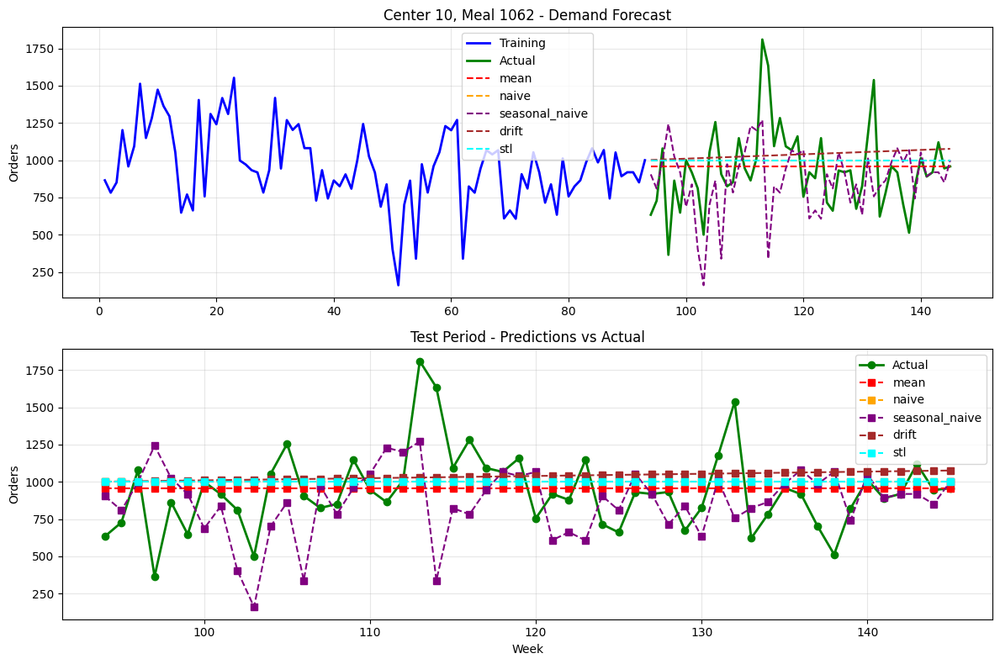


Plotting: Center 10, Meal 1109


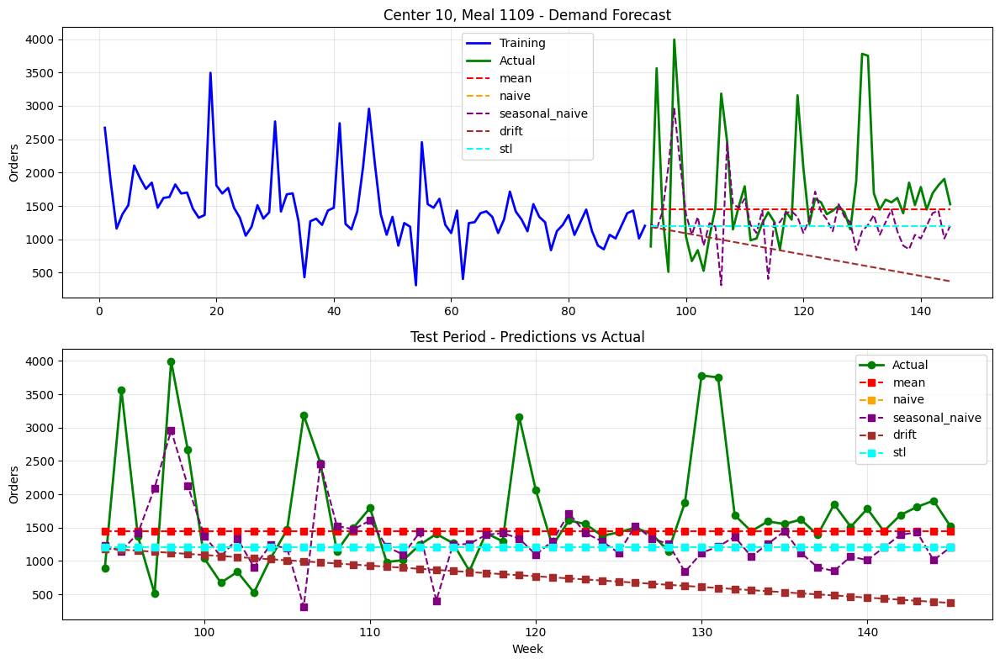


Plotting: Center 10, Meal 1198


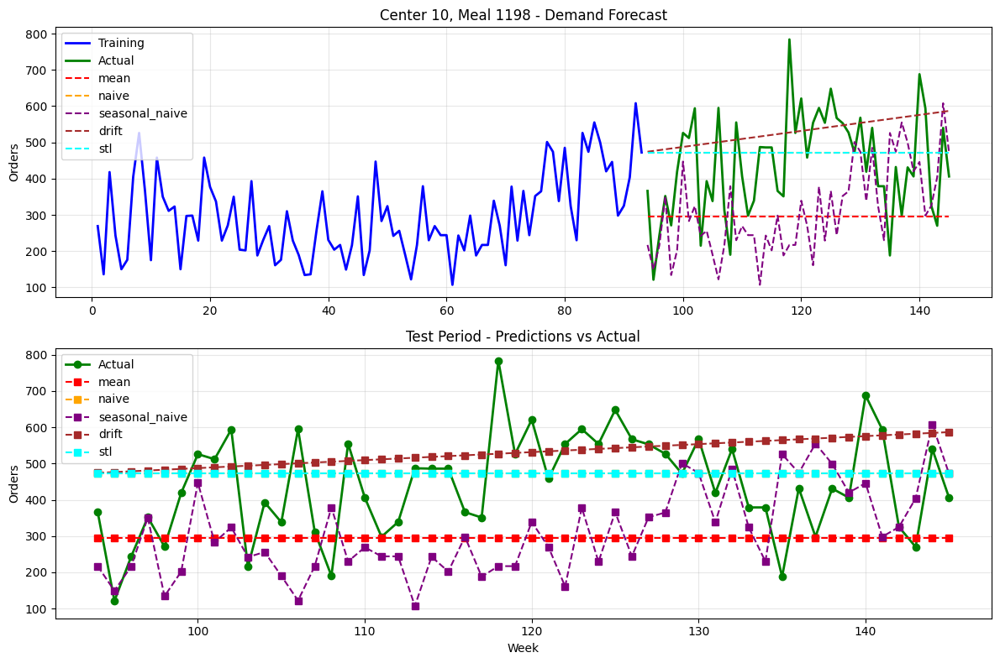


OVERALL PERFORMANCE:
------------------------------------------------------------
Method          RMSE       MAE        MAPE       MASE      
------------------------------------------------------------
drift           558.800    440.711    41.450     1.604     
mean            432.666    293.802    30.588     1.296     
naive           447.288    311.147    31.831     1.230     
seasonal_naive  493.298    336.506    34.891     1.474     
stl             447.288    311.147    31.831     1.230     

BEST METHOD: mean (MAPE: 30.6%)


In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import pandas as pd
from math import sqrt

plt.style.use('default')
sns.set_palette("husl")

def calculate_mase(train_series, test_series, forecasts):
    try:
        if len(train_series) < 2:
            return float('inf')
        naive_forecasts = train_series.shift(1).dropna()
        if len(naive_forecasts) == 0:
            return float('inf')
        naive_errors = np.abs(train_series.iloc[1:] - naive_forecasts)
        mean_naive_error = np.mean(naive_errors)
        if mean_naive_error == 0:
            return float('inf')
        forecast_errors = np.abs(test_series - forecasts)
        mase = np.mean(forecast_errors) / mean_naive_error
        return mase
    except:
        return float('inf')

def calculate_all_metrics(train_series, test_series, forecasts, method_name):
    try:
        with np.errstate(divide='ignore', invalid='ignore'):
            mape = np.mean(np.abs((test_series - forecasts) / test_series)) * 100
            mape = np.nan_to_num(mape, nan=100.0, posinf=100.0, neginf=100.0)
        rmse_val = sqrt(mean_squared_error(test_series, forecasts))
        mae_val = mean_absolute_error(test_series, forecasts)
        mase_val = calculate_mase(train_series, test_series, forecasts)
        mase_val = 1000.0 if np.isinf(mase_val) else mase_val
        return {
            'method': method_name,
            'rmse': rmse_val,
            'mae': mae_val,
            'mape': mape,
            'mase': mase_val
        }
    except:
        return {
            'method': method_name,
            'rmse': 1000.0,
            'mae': 1000.0,
            'mape': 100.0,
            'mase': 1000.0
        }

def generate_benchmark_forecasts_complete(train_series, test_series):
    forecasts = {}
    try:
        mean_fc = np.full(len(test_series), np.mean(train_series))
        forecasts['mean'] = mean_fc
        naive_fc = np.full(len(test_series), train_series.iloc[-1])
        forecasts['naive'] = naive_fc
        seasonal_period = 52
        if len(train_series) >= seasonal_period:
            seasonal_fc = []
            for i in range(len(test_series)):
                seasonal_index = -seasonal_period + (i % seasonal_period)
                seasonal_fc.append(train_series.iloc[seasonal_index])
            forecasts['seasonal_naive'] = seasonal_fc
        else:
            forecasts['seasonal_naive'] = naive_fc
        if len(train_series) > 1:
            total_change = train_series.iloc[-1] - train_series.iloc[0]
            avg_change = total_change / (len(train_series) - 1)
            drift_fc = [train_series.iloc[-1] + avg_change * (i+1) for i in range(len(test_series))]
            forecasts['drift'] = drift_fc
        else:
            forecasts['drift'] = naive_fc
    except:
        naive_fc = np.full(len(test_series), train_series.iloc[-1] if len(train_series) > 0 else 0)
        forecasts = {
            'mean': naive_fc,
            'naive': naive_fc,
            'seasonal_naive': naive_fc,
            'drift': naive_fc
        }
    return forecasts

def plot_predictions(center_id, meal_id, train_data, test_data, forecasts_dict):
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
    
    train_weeks = train_data['week'].values
    test_weeks = test_data['week'].values
    train_orders = train_data['num_orders'].values
    test_orders = test_data['num_orders'].values
    
    ax1.plot(train_weeks, train_orders, 'blue', linewidth=2, label='Training')
    ax1.plot(test_weeks, test_orders, 'green', linewidth=2, label='Actual')
    
    colors = ['red', 'orange', 'purple', 'brown', 'cyan', 'magenta']
    methods = list(forecasts_dict.keys())
    
    for i, method in enumerate(methods):
        forecast = forecasts_dict[method]
        ax1.plot(test_weeks, forecast, '--', color=colors[i], linewidth=1.5, label=f'{method}')
    
    ax1.set_title(f'Center {center_id}, Meal {meal_id} - Demand Forecast')
    ax1.set_ylabel('Orders')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    ax2.plot(test_weeks, test_orders, 'green', linewidth=2, label='Actual', marker='o')
    
    for i, method in enumerate(methods):
        forecast = forecasts_dict[method]
        ax2.plot(test_weeks, forecast, '--', color=colors[i], linewidth=1.5, marker='s', label=f'{method}')
    
    ax2.set_title('Test Period - Predictions vs Actual')
    ax2.set_xlabel('Week')
    ax2.set_ylabel('Orders')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    return fig

print("Generating forecasts and plots...")

all_metrics = []
plots_data = []

series_count = 0
max_plots = 3

for (center_id, meal_id), group in train_df.groupby(['center_id', 'meal_id']):
    if series_count >= max_plots:
        break
        
    group = group.sort_values('week')
    n_obs = len(group)
    split_point = n_obs - min(test_size_weeks, n_obs - 1)
    
    train_data = group.iloc[:split_point]
    test_data = group.iloc[split_point:]
    
    if len(test_data) == 0:
        continue
    
    train_series = train_data['num_orders']
    test_series = test_data['num_orders']
    
    stl_result = stl_decomposition_forecasting(train_series, test_series)
    benchmark_forecasts = generate_benchmark_forecasts_complete(train_series, test_series)
    
    all_forecasts = benchmark_forecasts.copy()
    all_forecasts['stl'] = stl_result['forecasts']
    
    series_metrics = []
    for method, forecast in all_forecasts.items():
        metrics = calculate_all_metrics(train_series, test_series, forecast, method)
        metrics.update({
            'center_id': center_id,
            'meal_id': meal_id
        })
        series_metrics.append(metrics)
    
    all_metrics.extend(series_metrics)
    
    print(f"\nPlotting: Center {center_id}, Meal {meal_id}")
    plot_predictions(center_id, meal_id, train_data, test_data, all_forecasts)
    
    series_count += 1

metrics_df = pd.DataFrame(all_metrics)

print("\nOVERALL PERFORMANCE:")
print("-" * 60)
overall_performance = metrics_df.groupby('method').agg({
    'rmse': 'mean',
    'mae': 'mean', 
    'mape': 'mean',
    'mase': 'mean'
}).round(3)

print(f"{'Method':<15} {'RMSE':<10} {'MAE':<10} {'MAPE':<10} {'MASE':<10}")
print("-" * 60)
for method, row in overall_performance.iterrows():
    print(f"{method:<15} {row['rmse']:<10.3f} {row['mae']:<10.3f} {row['mape']:<10.3f} {row['mase']:<10.3f}")

best_method = overall_performance['mape'].idxmin()
best_mape = overall_performance.loc[best_method, 'mape']
print(f"\nBEST METHOD: {best_method} (MAPE: {best_mape:.1f}%)")